<a href="https://colab.research.google.com/github/zhafirahra/Alzheimer-s-Classification/blob/main/Alzheimer's_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np

# Visualization
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

# Machine Learning Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Ensemble Models
import xgboost as xgb
import lightgbm as lgb
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier

# Tensorflow and Keras for Neural Network
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout, Input

# Useful
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_val_score
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, MinMaxScaler, PowerTransformer
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as Imbpipeline
from imblearn.over_sampling import SMOTE

# Ignore all warnings
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [2]:
# Load the dataset
file_path = '/content/alzheimers_disease_data (1).csv'
data = pd.read_csv(file_path)
data

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,DoctorInCharge
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,0,0,1.725883,0,0,0,1,0,0,XXXConfid
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,0,2.592424,0,0,0,0,1,0,XXXConfid
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,0,7.119548,0,1,0,1,0,0,XXXConfid
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,0,1,6.481226,0,0,0,0,0,0,XXXConfid
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0,0.014691,0,0,1,1,0,0,XXXConfid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,6895,61,0,0,1,39.121757,0,1.561126,4.049964,6.555306,...,0,0,4.492838,1,0,0,0,0,1,XXXConfid
2145,6896,75,0,0,2,17.857903,0,18.767261,1.360667,2.904662,...,0,1,9.204952,0,0,0,0,0,1,XXXConfid
2146,6897,77,0,0,1,15.476479,0,4.594670,9.886002,8.120025,...,0,0,5.036334,0,0,0,0,0,1,XXXConfid
2147,6898,78,1,3,1,15.299911,0,8.674505,6.354282,1.263427,...,0,0,3.785399,0,0,0,0,1,1,XXXConfid


In [4]:
import pandas as pd

# List of numerical columns you want descriptive statistics for
num_cols = ['PatientID','Age','BMI','AlcoholConsumption','PhysicalActivity','DietQuality','SleepQuality', 'SystolicBP', 'DiastolicBP', 'CholesterolTotal',
            'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides',
            'MMSE', 'FunctionalAssessment', 'ADL']

# Calculate descriptive statistics only for the specified numerical columns
num_stats = data[num_cols].describe()

# Display the descriptive statistics
print("Statistik Deskriptif untuk Variabel Numerik:\n", num_stats)

Statistik Deskriptif untuk Variabel Numerik:
          PatientID          Age          BMI  AlcoholConsumption  \
count  2149.000000  2149.000000  2149.000000         2149.000000   
mean   5825.000000    74.908795    27.655697           10.039442   
std     620.507185     8.990221     7.217438            5.757910   
min    4751.000000    60.000000    15.008851            0.002003   
25%    5288.000000    67.000000    21.611408            5.139810   
50%    5825.000000    75.000000    27.823924            9.934412   
75%    6362.000000    83.000000    33.869778           15.157931   
max    6899.000000    90.000000    39.992767           19.989293   

       PhysicalActivity  DietQuality  SleepQuality   SystolicBP  DiastolicBP  \
count       2149.000000  2149.000000   2149.000000  2149.000000  2149.000000   
mean           4.920202     4.993138      7.051081   134.264774    89.847836   
std            2.857191     2.909055      1.763573    25.949352    17.592496   
min            0.0036

In [5]:
import pandas as pd

# Menghitung statistik deskriptif untuk seluruh data numerik (variabel rasio)
numeric_stats = data.describe()

# Menampilkan statistik deskriptif untuk variabel numerik (rasio)
print("Statistik Deskriptif untuk Variabel Numerik (Rasio):\n", numeric_stats)

Statistik Deskriptif untuk Variabel Numerik (Rasio):
          PatientID          Age       Gender    Ethnicity  EducationLevel  \
count  2149.000000  2149.000000  2149.000000  2149.000000     2149.000000   
mean   5825.000000    74.908795     0.506282     0.697534        1.286645   
std     620.507185     8.990221     0.500077     0.996128        0.904527   
min    4751.000000    60.000000     0.000000     0.000000        0.000000   
25%    5288.000000    67.000000     0.000000     0.000000        1.000000   
50%    5825.000000    75.000000     1.000000     0.000000        1.000000   
75%    6362.000000    83.000000     1.000000     1.000000        2.000000   
max    6899.000000    90.000000     1.000000     3.000000        3.000000   

               BMI      Smoking  AlcoholConsumption  PhysicalActivity  \
count  2149.000000  2149.000000         2149.000000       2149.000000   
mean     27.655697     0.288506           10.039442          4.920202   
std       7.217438     0.453173  

In [20]:
# Menentukan variabel nominal
nominal_columns = ['Diagnosis', 'Gender', 'Ethnicity','Smoking','FamilyHistoryAlzheimers','CardiovascularDisease','Diabetes','Depression', 'HeadInjury','Hypertension', 'MemoryComplaints','BehavioralProblems','Confusion','Disorientation','PersonalityChanges','DifficultyCompletingTasks','Forgetfulness']  # Ganti sesuai kolom Anda

for col in nominal_columns:
    # Frekuensi
    frekuensi = data[col].value_counts()
    # Persentase
    persentase = data[col].value_counts(normalize=True) * 100

    print(f"\nStatistik Deskriptif untuk {col}:\n")
    print("Frekuensi:")
    print(frekuensi)
    print("\nPersentase:")
    print(persentase)



Statistik Deskriptif untuk Diagnosis:

Frekuensi:
Diagnosis
0    1389
1     760
Name: count, dtype: int64

Persentase:
Diagnosis
0    64.634714
1    35.365286
Name: proportion, dtype: float64

Statistik Deskriptif untuk Gender:

Frekuensi:
Gender
1    1088
0    1061
Name: count, dtype: int64

Persentase:
Gender
1    50.628199
0    49.371801
Name: proportion, dtype: float64

Statistik Deskriptif untuk Ethnicity:

Frekuensi:
Ethnicity
0    1278
1     454
3     211
2     206
Name: count, dtype: int64

Persentase:
Ethnicity
0    59.469521
1    21.126105
3     9.818520
2     9.585854
Name: proportion, dtype: float64

Statistik Deskriptif untuk Smoking:

Frekuensi:
Smoking
0    1529
1     620
Name: count, dtype: int64

Persentase:
Smoking
0    71.149372
1    28.850628
Name: proportion, dtype: float64

Statistik Deskriptif untuk FamilyHistoryAlzheimers:

Frekuensi:
FamilyHistoryAlzheimers
0    1607
1     542
Name: count, dtype: int64

Persentase:
FamilyHistoryAlzheimers
0    74.778967
1    2

In [13]:
# Statistik deskriptif untuk variabel ordinal
ordinal_cols = ['EducationLevel']  # Tambahkan kolom ordinal lainnya sesuai dataset Anda

for col in ordinal_cols:
    print(f"\nFrekuensi untuk {col}:\n", data[col].value_counts())
    print(f"\nPersentase untuk {col}:\n", data[col].value_counts(normalize=True) * 100)
    print(f"\nMedian untuk {col}:", data[col].median())
    print(f"\nMode untuk {col}:", data[col].mode()[0])



Frekuensi untuk EducationLevel:
 EducationLevel
1    854
2    636
0    446
3    213
Name: count, dtype: int64

Persentase untuk EducationLevel:
 EducationLevel
1    39.739414
2    29.595161
0    20.753839
3     9.911587
Name: proportion, dtype: float64

Median untuk EducationLevel: 1.0

Mode untuk EducationLevel: 1


In [ ]:
pd.set_option('display.max_columns', 99)

In [ ]:
data.head()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,DoctorInCharge
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,9.025679,0,0,1,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,21.463532,6.518877,0,0,1.725883,0,0,0,1,0,0,XXXConfid
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,7.151293,0,0,0,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,20.613267,7.118696,0,0,2.592424,0,0,0,0,1,0,XXXConfid
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,9.673574,1,0,0,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,7.356249,5.895077,0,0,7.119548,0,1,0,1,0,0,XXXConfid
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,8.392554,0,0,0,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,13.991127,8.965106,0,1,6.481226,0,0,0,0,0,0,XXXConfid
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,5.597238,0,0,0,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,13.517609,6.045039,0,0,0.014691,0,0,1,1,0,0,XXXConfid


In [ ]:
data.shape

(2149, 35)

In [ ]:
data.isna().sum()

,0
PatientID,0
Age,0
Gender,0
Ethnicity,0
EducationLevel,0
BMI,0
Smoking,0
AlcoholConsumption,0
PhysicalActivity,0
DietQuality,0


In [ ]:
data.info

<bound method DataFrame.info of       PatientID  Age  Gender  Ethnicity  EducationLevel        BMI  Smoking  \
0          4751   73       0          0               2  22.927749        0   
1          4752   89       0          0               0  26.827681        0   
2          4753   73       0          3               1  17.795882        0   
3          4754   74       1          0               1  33.800817        1   
4          4755   89       0          0               0  20.716974        0   
...         ...  ...     ...        ...             ...        ...      ...   
2144       6895   61       0          0               1  39.121757        0   
2145       6896   75       0          0               2  17.857903        0   
2146       6897   77       0          0               1  15.476479        0   
2147       6898   78       1          3               1  15.299911        0   
2148       6899   72       0          0               2  33.289738        0   

      AlcoholConsumption  PhysicalActivity  DietQuality  SleepQuality  \
0              13.297218          6.327112     1.347214      9.025679   
1               4.542524          7.619885     0.518767      7.151293   
2              19.555085          7.844988     1.826335      9.673574   
3              12.209266          8.428001     7.435604      8.392554   
4              18.454356          6.310461     0.795498      5.597238   
...                  ...               ...          ...           ...   
2144            1.561126          4.049964     6.555306      7.535540   
2145           18.767261          1.360667     2.904662      8.555256   
2146            4.594670          9.886002     8.120025      5.769464   
2147            8.674505          6.354282     1.263427      8.322874   
2148            7.890703          6.570993     7.941404      9.878711   

      FamilyHistoryAlzheimers  CardiovascularDisease  Diabetes  Depression  \
0                           0                      0         1           1   
1                           0                      0         0           0   
2                           1                      0         0           0   
3                           0                      0         0           0   
4                           0                      0         0           0   
...                       ...                    ...       ...         ...   
2144                        0                      0         0           0   
2145                        0                      0         0           0   
2146                        0                      0         0           0   
2147                        0                      1         0           0   
2148                        0                      0         0           0   

      HeadInjury  Hypertension  SystolicBP  DiastolicBP  CholesterolTotal  \
0              0             0         142           72        242.366840   
1              0             0         115           64        231.162595   
2              0             0          99          116        284.181858   
3              0             0         118          115        159.582240   
4              0             0          94          117        237.602184   
...          ...           ...         ...          ...               ...   
2144           0             0         122          101        280.476824   
2145           0             0         152          106        186.384436   
2146           0             0         115          118        237.024558   
2147           0             0         103           96        242.197192   
2148           0             0         166           78        283.396797   

      CholesterolLDL  CholesterolHDL  CholesterolTriglycerides       MMSE  \
0          56.150897       33.682563                162.189143  21.463532   
1         193.407996       79.028477                294.630909  20.613267   
2         153.322762       69.772292             

In [ ]:
#cek data duplikat
data['PatientID'].duplicated().sum()

0

In [ ]:
data.drop(['PatientID'], axis=1, inplace=True)
data.shape

(2149, 34)

In [ ]:
data.dtypes

,0
Age,int64
Gender,int64
Ethnicity,int64
EducationLevel,int64
BMI,float64
Smoking,int64
AlcoholConsumption,float64
PhysicalActivity,float64
DietQuality,float64
SleepQuality,float64


In [ ]:
#drop data karena tidak digunakan
data.drop(['DoctorInCharge'], axis=1, inplace=True)
data.shape

(2149, 33)

In [ ]:
from sklearn.model_selection import train_test_split

# Pembagian data training 80% dan data testing 20%
X = data.drop('Diagnosis', axis=1)
y = data['Diagnosis']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

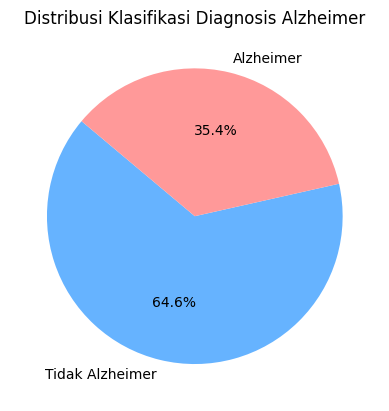

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Hitung jumlah klasifikasi 0 dan 1 pada kolom 'Diagnosis'
counts = data['Diagnosis'].value_counts()

# Membuat pie chart
labels = ['Tidak Alzheimer', 'Alzheimer']  # Beri label untuk klasifikasi 0 dan 1
colors = ['#66b3ff', '#ff9999']  # Warna untuk setiap bagian
plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('Distribusi Klasifikasi Diagnosis Alzheimer')
plt.show()


In [ ]:
binary_col = []
for col in data.columns:
    if data[col].dtype in ["int64", "float64"]:
        unique_val = data[col].nunique()
        if unique_val == 2:
            binary_col.append(col)
data[binary_col]

,Gender,Smoking,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,MemoryComplaints,BehavioralProblems,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0
3,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
2145,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
2146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2147,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1


In [ ]:
nonbinary_col = []
for col in data.columns:
    if data[col].dtype in ["int64", "float64"]:
        unique_val = data[col].nunique()
        if unique_val > 2:
            nonbinary_col.append(col)
data[nonbinary_col]

,Age,Ethnicity,EducationLevel,BMI,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,ADL
0,73,0,2,22.927749,13.297218,6.327112,1.347214,9.025679,142,72,242.366840,56.150897,33.682563,162.189143,21.463532,6.518877,1.725883
1,89,0,0,26.827681,4.542524,7.619885,0.518767,7.151293,115,64,231.162595,193.407996,79.028477,294.630909,20.613267,7.118696,2.592424
2,73,3,1,17.795882,19.555085,7.844988,1.826335,9.673574,99,116,284.181858,153.322762,69.772292,83.638324,7.356249,5.895077,7.119548
3,74,0,1,33.800817,12.209266,8.428001,7.435604,8.392554,118,115,159.582240,65.366637,68.457491,277.577358,13.991127,8.965106,6.481226
4,89,0,0,20.716974,18.454356,6.310461,0.795498,5.597238,94,117,237.602184,92.869700,56.874305,291.198780,13.517609,6.045039,0.014691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,61,0,1,39.121757,1.561126,4.049964,6.555306,7.535540,122,101,280.476824,94.870490,60.943092,234.520123,1.201190,0.238667,4.492838
2145,75,0,2,17.857903,18.767261,1.360667,2.904662,8.555256,152,106,186.384436,95.410700,93.649735,367.986877,6.458060,8.687480,9.204952
2146,77,0,1,15.476479,4.594670,9.886002,8.120025,5.769464,115,118,237.024558,156.267294,99.678209,294.802338,17.011003,1.972137,5.036334
2147,78,3,1,15.299911,8.674505,6.354282,1.263427,8.322874,103,96,242.197192,52.482961,81.281111,145.253746,4.030491,5.173891,3.785399


In [ ]:
#cek imbalance
data['Diagnosis'].value_counts()

,count
Diagnosis,
0,1389
1,760


In [ ]:
1389 / 760

1.8276315789473685

In [ ]:
#cek outliers
data[nonbinary_col].describe()
 #tidak ada outlier

,Age,Ethnicity,EducationLevel,BMI,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,ADL
count,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000
mean,74.908795,0.697534,1.286645,27.655697,10.039442,4.920202,4.993138,7.051081,134.264774,89.847836,225.197519,124.335944,59.463533,228.281496,14.755132,5.080055,4.982958
std,8.990221,0.996128,0.904527,7.217438,5.757910,2.857191,2.909055,1.763573,25.949352,17.592496,42.542233,43.366584,23.139174,101.986721,8.613151,2.892743,2.949775
min,60.000000,0.000000,0.000000,15.008851,0.002003,0.003616,0.009385,4.002629,90.000000,60.000000,150.093316,50.230707,20.003434,50.407194,0.005312,0.000460,0.001288
25%,67.000000,0.000000,1.000000,21.611408,5.139810,2.570626,2.458455,5.482997,112.000000,74.000000,190.252963,87.195798,39.095698,137.583222,7.167602,2.566281,2.342836
50%,75.000000,0.000000,1.000000,27.823924,9.934412,4.766424,5.076087,7.115646,134.000000,91.000000,225.086430,123.342593,59.768237,230.301983,14.441660,5.094439,5.038973
75%,83.000000,1.000000,2.000000,33.869778,15.157931,7.427899,7.558625,8.562521,157.000000,105.000000,262.031657,161.733733,78.939050,314.839046,22.161028,7.546981,7.581490
max,90.000000,3.000000,3.000000,39.992767,19.989293,9.987429,9.998346,9.999840,179.000000,119.000000,299.993352,199.965665,99.980324,399.941862,29.991381,9.996467,9.999747


# DATA **PREPROCESSING**

In [ ]:
#FEATURE ENGINEERING
data.head()

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
0,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,9.025679,0,0,1,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,21.463532,6.518877,0,0,1.725883,0,0,0,1,0,0
1,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,7.151293,0,0,0,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,20.613267,7.118696,0,0,2.592424,0,0,0,0,1,0
2,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,9.673574,1,0,0,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,7.356249,5.895077,0,0,7.119548,0,1,0,1,0,0
3,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,8.392554,0,0,0,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,13.991127,8.965106,0,1,6.481226,0,0,0,0,0,0
4,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,5.597238,0,0,0,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,13.517609,6.045039,0,0,0.014691,0,0,1,1,0,0


In [ ]:
#Feature Engineering on Medical History columns
data['RiskFactorScore'] = data[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes', 'Depression', 'HeadInjury', 'Hypertension']].sum(axis=1)
data.head()

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,RiskFactorScore
0,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,9.025679,0,0,1,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,21.463532,6.518877,0,0,1.725883,0,0,0,1,0,0,2
1,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,7.151293,0,0,0,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,20.613267,7.118696,0,0,2.592424,0,0,0,0,1,0,0
2,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,9.673574,1,0,0,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,7.356249,5.895077,0,0,7.119548,0,1,0,1,0,0,1
3,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,8.392554,0,0,0,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,13.991127,8.965106,0,1,6.481226,0,0,0,0,0,0,0
4,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,5.597238,0,0,0,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,13.517609,6.045039,0,0,0.014691,0,0,1,1,0,0,0


In [ ]:
data['Diabetes_CVD'] = data['Diabetes'] * data['CardiovascularDisease']
data.head()

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,RiskFactorScore,Diabetes_CVD
0,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,9.025679,0,0,1,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,21.463532,6.518877,0,0,1.725883,0,0,0,1,0,0,2,0
1,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,7.151293,0,0,0,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,20.613267,7.118696,0,0,2.592424,0,0,0,0,1,0,0,0
2,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,9.673574,1,0,0,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,7.356249,5.895077,0,0,7.119548,0,1,0,1,0,0,1,0
3,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,8.392554,0,0,0,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,13.991127,8.965106,0,1,6.481226,0,0,0,0,0,0,0,0
4,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,5.597238,0,0,0,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,13.517609,6.045039,0,0,0.014691,0,0,1,1,0,0,0,0


In [ ]:
data['AgeGroup'] = pd.cut(data['Age'], bins=[60, 70, 80, 90, 100], labels=['60-70', '70-80', '80-90', '90+'], right=False)
data.head()

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,RiskFactorScore,Diabetes_CVD,AgeGroup
0,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,9.025679,0,0,1,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,21.463532,6.518877,0,0,1.725883,0,0,0,1,0,0,2,0,70-80
1,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,7.151293,0,0,0,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,20.613267,7.118696,0,0,2.592424,0,0,0,0,1,0,0,0,80-90
2,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,9.673574,1,0,0,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,7.356249,5.895077,0,0,7.119548,0,1,0,1,0,0,1,0,70-80
3,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,8.392554,0,0,0,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,13.991127,8.965106,0,1,6.481226,0,0,0,0,0,0,0,0,70-80
4,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,5.597238,0,0,0,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,13.517609,6.045039,0,0,0.014691,0,0,1,1,0,0,0,0,80-90


In [ ]:
data['AgeGroup'].unique()

['70-80', '80-90', '60-70', '90+']
Categories (4, object): ['60-70' < '70-80' < '80-90' < '90+']

In [ ]:
data[data['Age']==60]

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,RiskFactorScore,Diabetes_CVD,AgeGroup
37,60,1,0,2,31.568689,0,3.478409,4.773200,8.856834,5.539086,0,1,0,0,1,0,157,98,195.472709,58.260787,31.224840,239.809323,16.640194,6.538658,0,1,7.605224,1,0,0,0,0,0,2,0,60-70
109,60,1,0,2,24.974286,0,18.454896,3.722786,3.795212,5.401475,0,0,0,0,0,0,147,111,162.439707,62.464567,48.232967,107.560343,22.658849,8.039720,0,0,6.943432,0,0,1,0,1,0,0,0,60-70
116,60,1,0,0,30.017337,0,6.369179,5.371701,4.475316,8.054286,0,0,1,0,0,0,160,93,275.845739,110.267740,97.330825,311.738001,10.720277,9.973697,0,0,6.499084,0,0,0,0,0,0,1,0,60-70
117,60,0,0,0,33.112496,0,0.722470,4.382985,1.612895,5.009484,1,0,0,0,1,0,129,107,279.653755,173.137636,70.456119,337.478845,5.507832,2.876671,0,0,1.822084,0,0,0,0,0,1,2,0,60-70
127,60,1,2,0,33.011119,0,18.924953,4.550098,2.913664,6.885777,0,0,0,0,0,0,175,78,254.789903,136.603404,27.912916,98.048914,18.504233,6.425784,1,0,1.953280,0,0,0,0,0,1,0,0,60-70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2060,60,1,1,2,33.272558,1,4.404632,0.593053,1.780646,4.153488,1,0,0,0,0,0,105,82,207.925972,160.918330,52.621916,315.818271,7.493069,4.228070,1,0,0.507718,0,0,1,0,1,1,1,0,60-70
2076,60,1,0,2,34.207502,1,11.258799,8.559800,3.339307,6.408287,0,1,0,1,0,0,96,69,285.004077,111.910966,63.309664,273.039636,3.660698,1.860304,0,1,5.319320,0,0,0,0,0,1,2,0,60-70
2082,60,1,0,1,37.089995,0,6.879326,3.611449,0.016446,6.478630,0,0,0,1,0,0,132,78,276.336741,173.279386,72.547319,268.235203,7.347983,4.160138,1,0,2.273081,0,1,1,0,0,0,1,0,60-70
2113,60,1,2,1,22.677545,0,12.121508,5.701564,8.213415,4.300610,0,1,0,0,0,0,134,68,247.361752,50.430083,26.103451,139.715023,27.535144,6.019407,0,0,0.004354,0,0,1,1,0,1,1,0,60-70


In [ ]:
#Create a feature that indicates if an individual has at least one risk factor.
data['HasAnyRiskFactor'] = data[['FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes', 'Depression', 'HeadInjury', 'Hypertension']].apply(lambda x: 1 if x.sum() > 0 else 0, axis=1)
data.head()

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,RiskFactorScore,Diabetes_CVD,AgeGroup,HasAnyRiskFactor
0,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,9.025679,0,0,1,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,21.463532,6.518877,0,0,1.725883,0,0,0,1,0,0,2,0,70-80,1
1,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,7.151293,0,0,0,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,20.613267,7.118696,0,0,2.592424,0,0,0,0,1,0,0,0,80-90,0
2,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,9.673574,1,0,0,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,7.356249,5.895077,0,0,7.119548,0,1,0,1,0,0,1,0,70-80,1
3,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,8.392554,0,0,0,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,13.991127,8.965106,0,1,6.481226,0,0,0,0,0,0,0,0,70-80,0
4,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,5.597238,0,0,0,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,13.517609,6.045039,0,0,0.014691,0,0,1,1,0,0,0,0,80-90,0


In [ ]:
#Feature Engineering on Symptoms columns
data['SymptomCount'] = data[['Confusion', 'Disorientation', 'PersonalityChanges', 'DifficultyCompletingTasks', 'Forgetfulness']].sum(axis=1)
data.head()

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,RiskFactorScore,Diabetes_CVD,AgeGroup,HasAnyRiskFactor,SymptomCount
0,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,9.025679,0,0,1,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,21.463532,6.518877,0,0,1.725883,0,0,0,1,0,0,2,0,70-80,1,1
1,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,7.151293,0,0,0,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,20.613267,7.118696,0,0,2.592424,0,0,0,0,1,0,0,0,80-90,0,1
2,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,9.673574,1,0,0,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,7.356249,5.895077,0,0,7.119548,0,1,0,1,0,0,1,0,70-80,1,2
3,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,8.392554,0,0,0,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,13.991127,8.965106,0,1,6.481226,0,0,0,0,0,0,0,0,70-80,0,0
4,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,5.597238,0,0,0,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,13.517609,6.045039,0,0,0.014691,0,0,1,1,0,0,0,0,80-90,0,2


In [ ]:
data['HasAnySymptom'] = data[['Confusion', 'Disorientation', 'PersonalityChanges', 'DifficultyCompletingTasks', 'Forgetfulness']].apply(lambda x: 1 if x.sum() > 0 else 0, axis=1)
data.head()

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,RiskFactorScore,Diabetes_CVD,AgeGroup,HasAnyRiskFactor,SymptomCount,HasAnySymptom
0,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,9.025679,0,0,1,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,21.463532,6.518877,0,0,1.725883,0,0,0,1,0,0,2,0,70-80,1,1,1
1,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,7.151293,0,0,0,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,20.613267,7.118696,0,0,2.592424,0,0,0,0,1,0,0,0,80-90,0,1,1
2,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,9.673574,1,0,0,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,7.356249,5.895077,0,0,7.119548,0,1,0,1,0,0,1,0,70-80,1,2,1
3,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,8.392554,0,0,0,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,13.991127,8.965106,0,1,6.481226,0,0,0,0,0,0,0,0,70-80,0,0,0
4,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,5.597238,0,0,0,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,13.517609,6.045039,0,0,0.014691,0,0,1,1,0,0,0,0,80-90,0,2,1


In [ ]:
data.shape

(2149, 39)

In [ ]:
data

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,RiskFactorScore,Diabetes_CVD,AgeGroup,HasAnyRiskFactor,SymptomCount,HasAnySymptom
0,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,9.025679,0,0,1,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,21.463532,6.518877,0,0,1.725883,0,0,0,1,0,0,2,0,70-80,1,1,1
1,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,7.151293,0,0,0,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,20.613267,7.118696,0,0,2.592424,0,0,0,0,1,0,0,0,80-90,0,1,1
2,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,9.673574,1,0,0,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,7.356249,5.895077,0,0,7.119548,0,1,0,1,0,0,1,0,70-80,1,2,1
3,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,8.392554,0,0,0,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,13.991127,8.965106,0,1,6.481226,0,0,0,0,0,0,0,0,70-80,0,0,0
4,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,5.597238,0,0,0,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,13.517609,6.045039,0,0,0.014691,0,0,1,1,0,0,0,0,80-90,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,61,0,0,1,39.121757,0,1.561126,4.049964,6.555306,7.535540,0,0,0,0,0,0,122,101,280.476824,94.870490,60.943092,234.520123,1.201190,0.238667,0,0,4.492838,1,0,0,0,0,1,0,0,60-70,0,1,1
2145,75,0,0,2,17.857903,0,18.767261,1.360667,2.904662,8.555256,0,0,0,0,0,0,152,106,186.384436,95.410700,93.649735,367.986877,6.458060,8.687480,0,1,9.204952,0,0,0,0,0,1,0,0,70-80,0,0,0
2146,77,0,0,1,15.476479,0,4.594670,9.886002,8.120025,5.769464,0,0,0,0,0,0,115,118,237.024558,156.267294,99.678209,294.802338,17.011003,1.972137,0,0,5.036334,0,0,0,0,0,1,0,0,70-80,0,0,0
2147,78,1,3,1,15.299911,0,8.674505,6.354282,1.263427,8.322874,0,1,0,0,0,0,103,96,242.197192,52.482961,81.281111,145.253746,4.030491,5.173891,0,0,3.785399,0,0,0,0,1,1,1,0,70-80,1,1,1


In [ ]:
#ENCODING
data = pd.get_dummies(data, columns=['AgeGroup'], drop_first=True).astype(int)
data

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,RiskFactorScore,Diabetes_CVD,HasAnyRiskFactor,SymptomCount,HasAnySymptom,AgeGroup_70-80,AgeGroup_80-90,AgeGroup_90+
0,73,0,0,2,22,0,13,6,1,9,0,0,1,1,0,0,142,72,242,56,33,162,21,6,0,0,1,0,0,0,1,0,0,2,0,1,1,1,1,0,0
1,89,0,0,0,26,0,4,7,0,7,0,0,0,0,0,0,115,64,231,193,79,294,20,7,0,0,2,0,0,0,0,1,0,0,0,0,1,1,0,1,0
2,73,0,3,1,17,0,19,7,1,9,1,0,0,0,0,0,99,116,284,153,69,83,7,5,0,0,7,0,1,0,1,0,0,1,0,1,2,1,1,0,0
3,74,1,0,1,33,1,12,8,7,8,0,0,0,0,0,0,118,115,159,65,68,277,13,8,0,1,6,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,89,0,0,0,20,0,18,6,0,5,0,0,0,0,0,0,94,117,237,92,56,291,13,6,0,0,0,0,0,1,1,0,0,0,0,0,2,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,61,0,0,1,39,0,1,4,6,7,0,0,0,0,0,0,122,101,280,94,60,234,1,0,0,0,4,1,0,0,0,0,1,0,0,0,1,1,0,0,0
2145,75,0,0,2,17,0,18,1,2,8,0,0,0,0,0,0,152,106,186,95,93,367,6,8,0,1,9,0,0,0,0,0,1,0,0,0,0,0,1,0,0
2146,77,0,0,1,15,0,4,9,8,5,0,0,0,0,0,0,115,118,237,156,99,294,17,1,0,0,5,0,0,0,0,0,1,0,0,0,0,0,1,0,0
2147,78,1,3,1,15,0,8,6,1,8,0,1,0,0,0,0,103,96,242,52,81,145,4,5,0,0,3,0,0,0,0,1,1,1,0,1,1,1,1,0,0


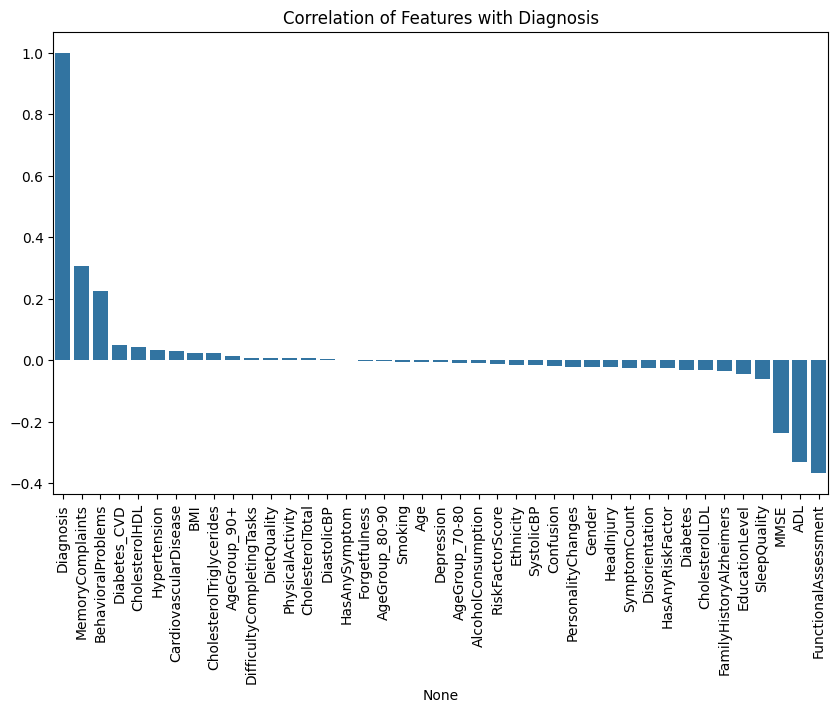

In [ ]:
corr_with_target = data.corr()['Diagnosis'].sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=corr_with_target.index, y=corr_with_target.values)
plt.xticks(rotation=90)
plt.title('Correlation of Features with Diagnosis')
plt.show()

In [ ]:
#create a Pipeline to Scale and Transform all the Non-Binary Numerical columns\
binary_col = []
for col in data.columns:
    if data[col].dtype in ["int64", "float64"]:
        unique_val = data[col].nunique()
        if unique_val == 2:
            binary_col.append(col)
data[binary_col]

,Gender,Smoking,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,MemoryComplaints,BehavioralProblems,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,Diabetes_CVD,HasAnyRiskFactor,HasAnySymptom,AgeGroup_70-80,AgeGroup_80-90,AgeGroup_90+
0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0
2,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,1,0,0
3,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0
2145,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0
2146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
2147,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,1,0,0


In [ ]:
nonbinary_col = []
for col in data.columns:
    if data[col].dtype in ["int64", "float64"]:
        unique_val = data[col].nunique()
        if unique_val > 2:
            nonbinary_col.append(col)
data[nonbinary_col]

,Age,Ethnicity,EducationLevel,BMI,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,ADL,RiskFactorScore,SymptomCount
0,73,0,2,22,13,6,1,9,142,72,242,56,33,162,21,6,1,2,1
1,89,0,0,26,4,7,0,7,115,64,231,193,79,294,20,7,2,0,1
2,73,3,1,17,19,7,1,9,99,116,284,153,69,83,7,5,7,1,2
3,74,0,1,33,12,8,7,8,118,115,159,65,68,277,13,8,6,0,0
4,89,0,0,20,18,6,0,5,94,117,237,92,56,291,13,6,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,61,0,1,39,1,4,6,7,122,101,280,94,60,234,1,0,4,0,1
2145,75,0,2,17,18,1,2,8,152,106,186,95,93,367,6,8,9,0,0
2146,77,0,1,15,4,9,8,5,115,118,237,156,99,294,17,1,5,0,0
2147,78,3,1,15,8,6,1,8,103,96,242,52,81,145,4,5,3,1,1


In [ ]:
binary_col.remove("Diagnosis")
len(binary_col)

21

In [ ]:
pipeline1 = Pipeline(steps=[
    ("impute", SimpleImputer(strategy="median")),
    ("power_transformer", PowerTransformer()),
    ("scaler", StandardScaler()),
])

pipeline2 = Pipeline(steps=[
    ("impute", SimpleImputer(strategy="median")),
])

transformer = ColumnTransformer(transformers=[
    ("pipeline1", pipeline1, nonbinary_col),
    ("pipeline2", pipeline2, binary_col)
])

In [ ]:
transformed_data = transformer.fit_transform(data.drop(['Diagnosis'],axis=1))
transformed_data

array([[-0.18448968, -0.81299856,  0.81250052, ...,  1.        ,
         0.        ,  0.        ],
       [ 1.52875409, -0.81299856, -1.53155763, ...,  0.        ,
         1.        ,  0.        ],
       [-0.18448968,  1.56059501, -0.23602051, ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [ 0.25939581, -0.81299856, -0.23602051, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.36863383,  1.56059501, -0.23602051, ...,  1.        ,
         0.        ,  0.        ],
       [-0.29726346, -0.81299856,  0.81250052, ...,  1.        ,
         0.        ,  0.        ]])

In [ ]:
transformed_data.shape

(2149, 40)

In [ ]:
#We got our Transformed data, now we will simply extract the Features names and Create a new Transformed DataFrame out of it

In [ ]:
pipeline1_features_names = transformer.\
named_transformers_['pipeline1'].get_feature_names_out(nonbinary_col).tolist()

pipeline2_features_names = transformer.\
named_transformers_['pipeline2'].get_feature_names_out(binary_col).tolist()

features_names = pipeline1_features_names + pipeline2_features_names
features_names

['Age',
 'Ethnicity',
 'EducationLevel',
 'BMI',
 'AlcoholConsumption',
 'PhysicalActivity',
 'DietQuality',
 'SleepQuality',
 'SystolicBP',
 'DiastolicBP',
 'CholesterolTotal',
 'CholesterolLDL',
 'CholesterolHDL',
 'CholesterolTriglycerides',
 'MMSE',
 'FunctionalAssessment',
 'ADL',
 'RiskFactorScore',
 'SymptomCount',
 'Gender',
 'Smoking',
 'FamilyHistoryAlzheimers',
 'CardiovascularDisease',
 'Diabetes',
 'Depression',
 'HeadInjury',
 'Hypertension',
 'MemoryComplaints',
 'BehavioralProblems',
 'Confusion',
 'Disorientation',
 'PersonalityChanges',
 'DifficultyCompletingTasks',
 'Forgetfulness',
 'Diabetes_CVD',
 'HasAnyRiskFactor',
 'HasAnySymptom',
 'AgeGroup_70-80',
 'AgeGroup_80-90',
 'AgeGroup_90+']

In [ ]:
pd.set_option('display.max_columns', 100)
transformed_data = pd.DataFrame(transformed_data, columns=features_names)
transformed_data[binary_col] = transformed_data[binary_col].astype(int)
transformed_data['Diagnosis'] = data['Diagnosis']
transformed_data

,Age,Ethnicity,EducationLevel,BMI,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,MMSE,FunctionalAssessment,ADL,RiskFactorScore,SymptomCount,Gender,Smoking,FamilyHistoryAlzheimers,CardiovascularDisease,Diabetes,Depression,HeadInjury,Hypertension,MemoryComplaints,BehavioralProblems,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diabetes_CVD,HasAnyRiskFactor,HasAnySymptom,AgeGroup_70-80,AgeGroup_80-90,AgeGroup_90+,Diagnosis
0,-0.184490,-0.812999,0.812501,-0.699520,0.636363,0.596626,-1.225392,1.409136,0.321958,-1.013897,0.419524,-1.662556,-1.130827,-0.598471,0.797721,0.532895,-1.197819,1.114437,0.221525,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,1,1,0,0,0
1,1.528754,-0.812999,-1.531558,-0.134892,-0.921591,0.902577,-1.706272,0.272536,-0.727978,-1.479752,0.163842,1.516340,0.873734,0.671192,0.698867,0.845016,-0.790669,-1.245369,0.221525,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0
2,-0.184490,1.560595,-0.236021,-1.432576,1.510635,0.902577,-1.225392,1.409136,-1.382643,1.475501,1.378136,0.697103,0.480045,-1.475048,-0.772633,0.209765,0.855912,0.221944,1.157231,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,1,1,0,0,0
3,-0.072451,-0.812999,-0.236021,0.816924,0.481398,1.197244,0.868632,0.844074,-0.608152,1.420037,-1.568601,-1.407118,0.439700,0.516498,-0.040250,1.147821,0.558246,-1.245369,-1.274806,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
4,1.528754,-0.812999,-1.531558,-0.988707,1.370565,0.596626,-1.706272,-0.893849,-1.593152,1.530922,0.303560,-0.699037,-0.060512,0.644045,-0.040250,0.532895,-1.670465,-1.245369,1.157231,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,-1.590997,-0.812999,-0.236021,1.603255,-1.602933,-0.058599,0.564827,0.272536,-0.449700,0.638668,1.287957,-0.649376,0.109730,0.115022,-1.727149,-1.726476,-0.076814,-1.245369,0.221525,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1
2145,0.038867,-0.812999,0.812501,-1.432576,1.370565,-1.226457,-0.810726,0.844074,0.696228,0.918806,-0.905628,-0.624669,1.398955,1.313908,-0.909274,1.147821,1.421565,-1.245369,-1.274806,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1
2146,0.259396,-0.812999,-0.236021,-1.736252,-0.921591,1.482239,1.161914,-0.893849,-0.727978,1.586298,0.303560,0.760697,1.616123,0.671192,0.393167,-1.263356,0.248246,-1.245369,-1.274806,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
2147,0.368634,1.560595,-0.236021,-1.736252,-0.175569,0.596626,-1.225392,0.844074,-1.216367,0.357252,0.419524,-1.780107,0.950499,-0.776772,-1.202405,0.209765,-0.420961,0.221944,0.221525,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,1


In [ ]:
transformed_data.dtypes

,0
Age,float64
Ethnicity,float64
EducationLevel,float64
BMI,float64
AlcoholConsumption,float64
PhysicalActivity,float64
DietQuality,float64
SleepQuality,float64
SystolicBP,float64
DiastolicBP,float64


In [ ]:
transformed_data.isna().sum()

,0
Age,0
Ethnicity,0
EducationLevel,0
BMI,0
AlcoholConsumption,0
PhysicalActivity,0
DietQuality,0
SleepQuality,0
SystolicBP,0
DiastolicBP,0


# MACHINE LEARNING

In [ ]:
#SPLITTING DATA
X = transformed_data.drop(['Diagnosis'], axis=1)
y = transformed_data['Diagnosis']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
len(X_train), len(X_test)

(1719, 430)

In [ ]:
y_train.value_counts()

,count
Diagnosis,
0,1111
1,608


In [ ]:
y_test.value_counts()

,count
Diagnosis,
0,278
1,152


In [ ]:
#Oversampling using SMOTE
smote = SMOTE(sampling_strategy="minority")
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
y_train_smote.value_counts()

,count
Diagnosis,
0,1111
1,1111


In [ ]:
#Model Selection and Hyperparameters tuning
def main_gridsearchcv(model_params):
    scores = []
    kfold = StratifiedKFold(n_splits=5)
    for model, mp in model_params.items():
        grid = GridSearchCV(mp['model'], mp['params'], cv=5, return_train_score=False)
        grid.fit(X_train_smote, y_train_smote)

        # Predictions
        y_pred = grid.predict(X_test)

        # Calculate metrics
        roc_auc = roc_auc_score(y_test, y_pred)
        accuracy = accuracy_score(y_test, y_pred)

        scores.append({
            "model" : model,
            "best_estimator" : grid.best_estimator_,
            "best_score" : grid.best_score_,
            "best_params" : grid.best_params_,
            "roc_auc": roc_auc,
            "accuracy": accuracy
        })
    resultdata = pd.DataFrame(scores, columns=["model", "best_estimator", "best_score", "best_params", "roc_auc", "accuracy"])
    return resultdata


In [ ]:
boost_params = {
        "adaboost" : {
        "model" : AdaBoostClassifier(estimator=DecisionTreeClassifier()),
        "params" : {}
    },

    "gradient_boosting" : {
        "model" : GradientBoostingClassifier(),
        "params" : {}
    },

    "xgboost" : {
        "model" : xgb.XGBClassifier(),
        "params" : {}
    },

    "lightgbm" : {
        "model" : lgb.LGBMClassifier(verbose=-1),
        "params" : {}
    }
}
main_gridsearchcv(boost_params)

,model,best_estimator,best_score,best_params,roc_auc,accuracy
0,adaboost,(DecisionTreeClassifier(random_state=1042140074)),0.868596,{},0.890430,0.893023
1,gradient_boosting,([DecisionTreeRegressor(criterion='friedman_ms...,0.928439,{},0.945830,0.951163
2,xgboost,"XGBClassifier(base_score=None, booster=None, c...",0.941052,{},0.937453,0.944186
3,lightgbm,LGBMClassifier(verbose=-1),0.938347,{},0.945830,0.951163


In [ ]:
# Training and Predicting using Final Model
from xgboost import XGBClassifier

# Inisialisasi model XGBClassifier dengan parameter dasar
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="logloss", verbosity=0)

# Melatih model dengan data hasil SMOTE
xgb_model.fit(X_train_smote, y_train_smote)

# Evaluasi akurasi pada data uji
accuracy = xgb_model.score(X_test, y_test)
print(f"Accuracy on test data: {accuracy:.2f}")


Accuracy on test data: 0.94


In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

# Membuat prediksi dengan model XGBClassifier
final_predict = xgb_model.predict(X_test)

# Menghitung ROC AUC Score
roc_auc = roc_auc_score(y_test, final_predict)
print(f"ROC AUC Score: {roc_auc:.2f}")

ROC AUC Score: 0.94


In [ ]:
print(classification_report(y_test, final_predict))

              precision    recall  f1-score   support

           0       0.95      0.96      0.96       278
           1       0.93      0.91      0.92       152

    accuracy                           0.94       430
   macro avg       0.94      0.94      0.94       430
weighted avg       0.94      0.94      0.94       430



Text(95.72222222222221, 0.5, 'Truth Values')

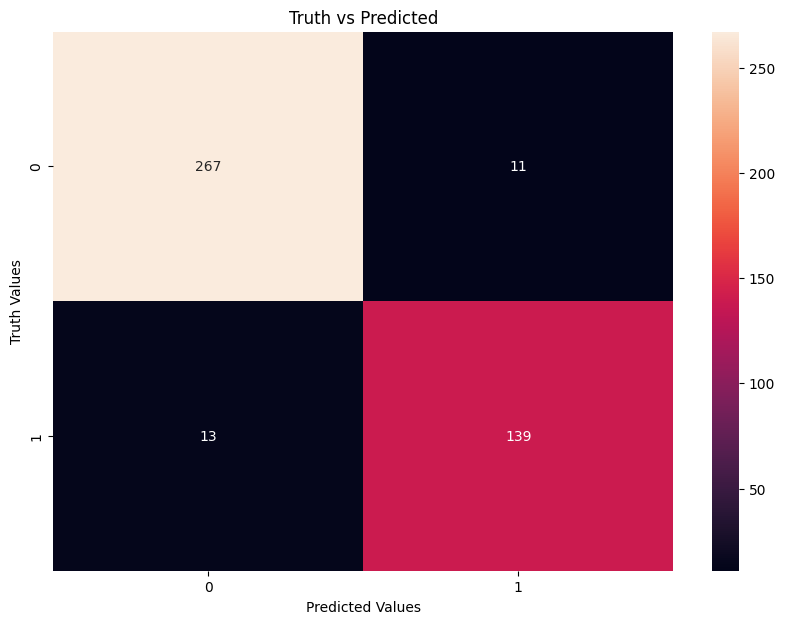

In [ ]:
cm = confusion_matrix(y_test, final_predict)
plt.figure(figsize=(10, 7))
plt.title("Truth vs Predicted")
sns.heatmap(cm, annot=True, fmt="d")
plt.xlabel("Predicted Values")
plt.ylabel("Truth Values")

In [ ]:
import pickle

# Save the model to a pickle file
with open('XGBoost_alzheimer_model.pickle', 'wb') as f:
    pickle.dump(xgb_model, f)
print("Model Succesfully saved.")

Model Succesfully saved.


In [ ]:
import json
columns = {
    'data_columns' : [col.lower() for col in X.columns]
}
with open("columns.json","w") as f:
    f.write(json.dumps(columns))

In [ ]:
transformed_data.to_csv("preprocessd_alzheimer.csv")

# CARA LAIN

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import xgboost as xgb
import numpy as np
import graphviz
from xgboost import to_graphviz

In [ ]:
#K-Fold Cross-Validation untuk Hyperparameter Tuning
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

# Definisikan hyperparameters yang akan dituning
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [2, 4, 6, 8],
    'min_child_weight': [1, 3, 5],
    'learning_rate': [0.1, 0.3],
    'gamma': [0, 1, 2],
    'alpha':[0, 1, 2, 3],
    'lambda':[0, 1, 2, 3],
    'subsample': [0.8, 1.0],
    'colsample_bylevel': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Model XGBoost
xgb_model = XGBClassifier(objective='binary:logistic', eval_metric='logloss')

# GridSearchCV dengan 5-Fold Cross-Validation
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5,scoring='accuracy', verbose=1, n_jobs=-1)
grid_search.fit(X_train_smote, y_train_smote)

# Menampilkan hyperparameter terbaik
print("Best Hyperparameters:", grid_search.best_params_)

Fitting 5 folds for each of 18432 candidates, totalling 92160 fits
Best Hyperparameters: {'alpha': 0, 'colsample_bylevel': 0.8, 'colsample_bytree': 0.8, 'gamma': 0, 'lambda': 1, 'learning_rate': 0.3, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 1.0}


In [ ]:
#Penentuan Hyperparameter Tuning
best_params = grid_search.best_params_

params = {
    'n_estimators': best_params['n_estimators'],
    'max_depth': best_params['max_depth'],
    'min_child_weight': best_params['min_child_weight'],
    'eta': best_params['learning_rate'],
    'gamma': best_params['gamma'],
    'alpha':best_params['alpha'],
    'lambda':best_params['lambda'],
    'subsample': best_params['subsample'],
    'colsample_bylevel': best_params['colsample_bylevel'],
    'colsample_bytree': best_params['colsample_bytree'],
    'objective': 'binary:logistic',
    'base_score': 0.5,
    'eval_metric': 'logloss',
}


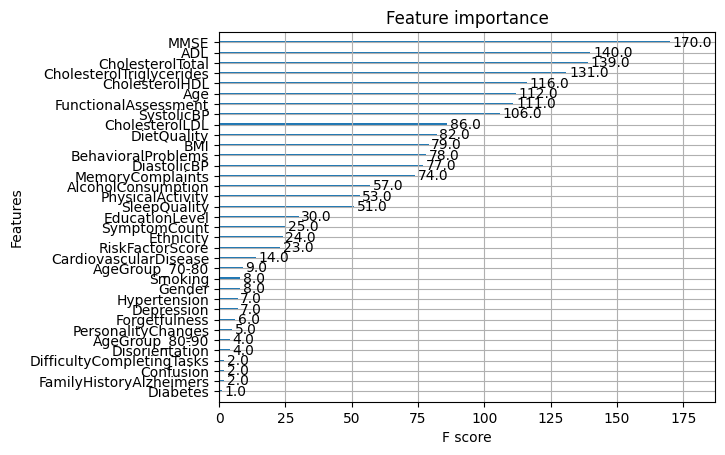

In [ ]:
from xgboost import XGBClassifier
model = XGBClassifier()
model.fit(X_train, y_train)
import matplotlib.pylab as plt
from matplotlib import pyplot
from xgboost import plot_importance
plot_importance(model) # top 10 most important features
plt.show()

In [ ]:
#Konversi ke DMatrix
import xgboost as xgb

dtrain = xgb.DMatrix(X_train_smote, label=y_train_smote)
dtest = xgb.DMatrix(X_test, label=y_test)

In [ ]:
params = {
    'max_depth': best_params['max_depth'],
    'min_child_weight': best_params['min_child_weight'],
    'eta': best_params['learning_rate'],
    'gamma': best_params['gamma'],
    'alpha':best_params['alpha'],
    'lambda':best_params['lambda'],
    'subsample': best_params['subsample'],
    'colsample_bylevel': best_params['colsample_bylevel'],
    'colsample_bytree': best_params['colsample_bytree'],
    'objective': 'binary:logistic',
    'base_score': 0.5,
    'eval_metric': 'logloss'
}

# Gunakan best_params['n_estimators'] untuk num_boost_round
num_boost_round = best_params['n_estimators']

# Melihat model XGBoost berdasarkan data training
bst = xgb.train(params, dtrain, num_boost_round=num_boost_round)
bst

In [ ]:
#Melihat XGBoost Fitted berdasarkan data testing
preds = bst.predict(dtest)
preds

array([9.98392880e-01, 1.37633428e-01, 9.97569740e-01, 9.72035468e-01,
       9.99989271e-01, 1.86327156e-02, 9.72393215e-01, 7.76274735e-03,
       3.49897072e-02, 9.99937296e-01, 1.63938603e-04, 9.96538162e-01,
       6.03241660e-02, 9.71559286e-01, 2.73807580e-03, 1.87926076e-03,
       7.80885853e-03, 4.65811696e-04, 7.47599006e-02, 8.98228765e-01,
       9.93607640e-01, 3.66106480e-02, 1.10303899e-02, 9.88183200e-01,
       7.32962132e-01, 9.96518731e-01, 9.79520559e-01, 8.76387060e-01,
       1.14480264e-01, 1.18951115e-03, 6.42920911e-01, 9.99967575e-01,
       9.23836231e-02, 5.42950556e-02, 3.27144973e-02, 3.03489603e-02,
       3.57618369e-02, 9.58244782e-04, 9.92275298e-01, 7.68096864e-01,
       9.99653816e-01, 6.04618865e-04, 9.98986781e-01, 9.79886856e-03,
       9.99999166e-01, 1.31536350e-02, 9.99979138e-01, 3.69883305e-03,
       7.57527292e-01, 2.98748109e-02, 2.17550638e-04, 9.98556197e-01,
       8.93729646e-03, 7.34578492e-03, 9.87454534e-01, 1.41865166e-03,
      

0:[FunctionalAssessment<0.209765121] yes=1,no=2,missing=2,gain=467.83136,cover=555.5
	1:[MMSE<1.08635962] yes=3,no=4,missing=4,gain=278.497437,cover=311.25
		3:[ADL<0.248246431] yes=7,no=8,missing=8,gain=242.154144,cover=271.5
			7:leaf=0.570175469,cover=170
			8:[MemoryComplaints<1] yes=15,no=16,missing=16,gain=110.624016,cover=101.5
				15:leaf=-0.184905663,cover=78.5
				16:leaf=0.550000012,cover=23
		4:[MemoryComplaints<1] yes=9,no=10,missing=10,gain=3.71691895,cover=39.75
			9:[CholesterolTriglycerides<1.33965576] yes=17,no=18,missing=18,gain=0.255844116,cover=32.25
				17:leaf=-0.551612914,cover=30
				18:leaf=-0.230769247,cover=2.25
			10:[DietQuality<0.593402565] yes=19,no=20,missing=20,gain=8.87815189,cover=7.5
				19:leaf=-0.450000018,cover=5
				20:leaf=0.171428591,cover=2.5
	2:[MemoryComplaints<1] yes=5,no=6,missing=6,gain=127.4664,cover=244.25
		5:[ADL<0.039237462] yes=11,no=12,missing=12,gain=11.4199524,cover=188.5
			11:[BehavioralProblems<1] yes=21,no=22,missing=22,gain

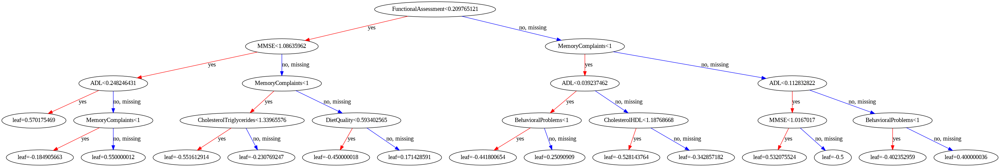

In [ ]:
#Menghitung Residual, Cover Value, Similarity Score, Gain Value, Leaf Output, Log Odds, dan Update Probabilitas
#model = bst.get_dump(with_stats=True) # The variable model was previously assigned to a list object
dump = bst.get_dump(with_stats=True) # Assign the output of bst.get_dump() to a new variable
#for tree in model:
for tree in dump: # Iterate over the new variable
    print(tree)

# Generate the dot file and render it
#dot_data = to_graphviz(model, num_trees=0) # Call the to_graphviz function with the Booster object
dot_data = to_graphviz(bst, num_trees=0)

# Render the graph to a PNG file
dot_data.format = 'png'
dot_data.render('xgboost_boost_tree')

# Display the graph
from IPython.display import Image
Image(filename='xgboost_boost_tree.png')

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import xgboost as xgb
import numpy as np
import graphviz
from xgboost import to_graphviz
# Initialize the XGBoost classifier
model = xgb.XGBClassifier(**params)
model

# Train the model
# Include the eval_set parameter with a validation dataset
# The eval_set should be a list of tuples, where each tuple contains
# the validation data and its corresponding label
# For example: eval_set=[(X_test, y_test)]
model.fit(X_train_smote, y_train_smote, eval_set=[(X_test, y_test)], verbose=False) # Added eval_set and set verbose to False to suppress output

# Generate the dot file and render it
dot_data = to_graphviz(model, num_trees=0)

# Render the graph to a PNG file
dot_data.format = 'png'
dot_data.render('xgboost_tree')

# Display the graph
from IPython.display import Image
Image(filename='xgboost_tree.png')

# Make predictions on the training set
y_train_pred = model.predict(X_train_smote)
y_train_pred

# Calculate residuals
residuals = y_train_smote - y_train_pred

import pandas as pd

# Jika residuals adalah pandas Series atau DataFrame
pd.set_option('display.max_rows', None)  # Menampilkan semua baris
print(residuals)

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      0
81      0
82      0
83      0
84      0
85      0
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0
99      0


In [ ]:
#Menghitung Cover Value dan Similarity Score

# Dump the model to get the internal structure
dump = model.get_booster().get_dump(with_stats=True)

# Print the dump of the first tree to see the structure
print(dump[0])

# Function to parse the dump
import re

def parse_tree_dump(dump):
    tree_info = []
    for tree in dump:
        tree_data = []
        lines = tree.split('\n')
        for line in lines:
            if 'leaf' in line:
                continue
            match = re.match(r'\s*(\d+):\[f(\d+)<([\d.]+)\] yes=(\d+),no=(\d+),missing=(\d+),gain=([\d.]+),cover=([\d.]+)', line)
            if match:
                node_info = {
                    'node': int(match.group(1)),
                    'feature': int(match.group(2)),
                    'threshold': float(match.group(3)),
                    'yes': int(match.group(4)),
                    'no': int(match.group(5)),
                    'missing': int(match.group(6)),
                    'gain': float(match.group(7)),
                    'cover': float(match.group(8))
                }
                tree_data.append(node_info)
        tree_info.append(tree_data)
    return tree_info

# Parse the model dump
tree_info = parse_tree_dump(dump)

# Print parsed information for the first tree
print(tree_info[0])

0:[FunctionalAssessment<0.209765121] yes=1,no=2,missing=2,gain=467.83136,cover=555.5
	1:[MMSE<1.08635962] yes=3,no=4,missing=4,gain=278.497437,cover=311.25
		3:[ADL<0.248246431] yes=7,no=8,missing=8,gain=242.154144,cover=271.5
			7:leaf=0.570175469,cover=170
			8:[MemoryComplaints<1] yes=15,no=16,missing=16,gain=110.624016,cover=101.5
				15:leaf=-0.184905663,cover=78.5
				16:leaf=0.550000012,cover=23
		4:[MemoryComplaints<1] yes=9,no=10,missing=10,gain=3.71691895,cover=39.75
			9:[CholesterolTriglycerides<1.33965576] yes=17,no=18,missing=18,gain=0.255844116,cover=32.25
				17:leaf=-0.551612914,cover=30
				18:leaf=-0.230769247,cover=2.25
			10:[DietQuality<0.593402565] yes=19,no=20,missing=20,gain=8.87815189,cover=7.5
				19:leaf=-0.450000018,cover=5
				20:leaf=0.171428591,cover=2.5
	2:[MemoryComplaints<1] yes=5,no=6,missing=6,gain=127.4664,cover=244.25
		5:[ADL<0.039237462] yes=11,no=12,missing=12,gain=11.4199524,cover=188.5
			11:[BehavioralProblems<1] yes=21,no=22,missing=22,gain

[{'node': 7, 'leaf_value': 0.570175469, 'cover': 170.0}, {'node': 16, 'leaf_value': 0.550000012, 'cover': 23.0}, {'node': 20, 'leaf_value': 0.171428591, 'cover': 2.5}, {'node': 22, 'leaf_value': 0.25090909, 'cover': 12.75}, {'node': 25, 'leaf_value': 0.532075524, 'cover': 25.5}, {'node': 28, 'leaf_value': 0.400000036, 'cover': 5.0}, {'node': 15, 'leaf_value': 0.182805419, 'cover': 185.283371}, {'node': 16, 'leaf_value': 0.536063135, 'cover': 24.2983055}, {'node': 17, 'leaf_value': 0.447739959, 'cover': 44.6436958}, {'node': 18, 'leaf_value': 0.0955721736, 'cover': 1.85096478}, {'node': 22, 'leaf_value': 0.249201387, 'cover': 1.46820676}, {'node': 25, 'leaf_value': 0.134547904, 'cover': 36.3211365}, {'node': 27, 'leaf_value': 0.224274293, 'cover': 23.7949638}, {'node': 7, 'leaf_value': 0.400410146, 'cover': 144.326874}, {'node': 18, 'leaf_value': 0.177490532, 'cover': 12.2191715}, {'node': 19, 'leaf_value': 0.384839743, 'cover': 22.8410587}, {'node': 23, 'leaf_value': 0.294808179, 'cove

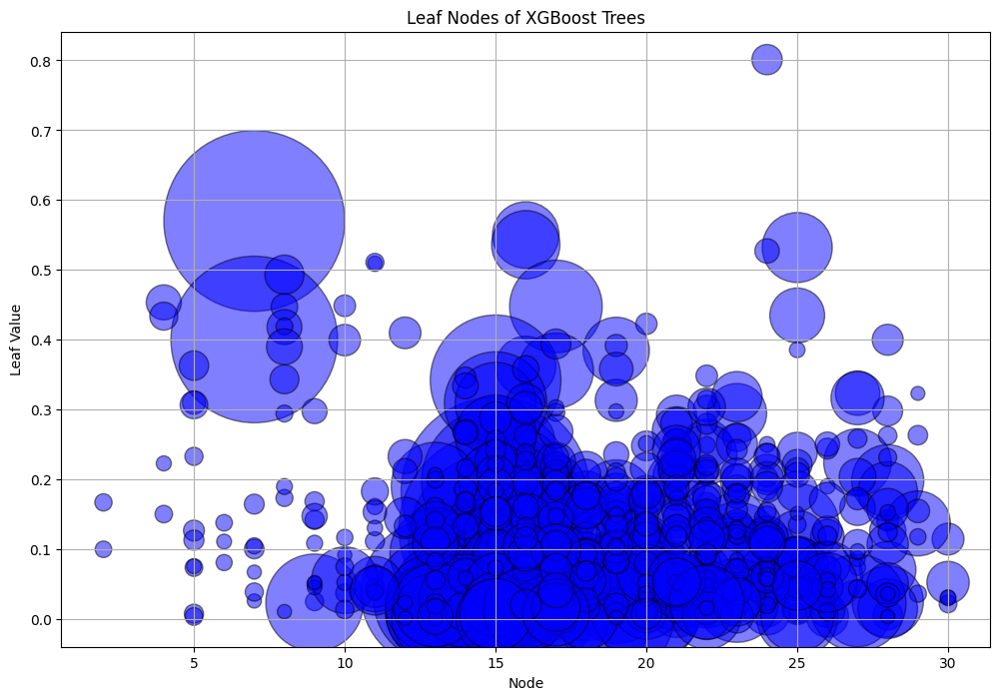

In [ ]:
#Menghitung Gain Value, Leaf Output, dan Log Odds
def parse_tree_leaves(dump):
    leaf_info = []
    for tree in dump:
        lines = tree.split('\n')
        for line in lines:
            if 'leaf' in line:
                match = re.match(r'\s*(\d+):leaf=([\d.]+),cover=([\d.]+)', line)
                if match:
                    leaf_data = {
                        'node': int(match.group(1)),
                        'leaf_value': float(match.group(2)),
                        'cover': float(match.group(3))
                    }
                    leaf_info.append(leaf_data)
    return leaf_info

# Parse the leaf nodes from the model dump
leaf_info = parse_tree_leaves(dump)

# Print parsed leaf information for the first tree
print(leaf_info)

# Convert leaf_info to a DataFrame for easier plotting
df_leaf_info = pd.DataFrame(leaf_info)

# Plot leaf nodes
plt.figure(figsize=(12, 8))
plt.scatter(df_leaf_info['node'], df_leaf_info['leaf_value'], s=df_leaf_info['cover']*100, alpha=0.5, c='blue', edgecolor='k')
plt.title('Leaf Nodes of XGBoost Trees')
plt.xlabel('Node')
plt.ylabel('Leaf Value')
plt.grid(True)
plt.show()

In [ ]:
#Memperbarui Nilai Probabilitas dan Normalisasi Menggunakan Fungsi Sigmoid
# Function to compute sigmoid
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Get the raw scores (log odds) from the model
log_odds = model.predict_proba(X_test)

# Convert log odds to probabilities
probabilities = sigmoid(log_odds)

print(probabilities)

[[0.50193346 0.72953534]
 [0.7065778  0.53025776]
 [0.5041216  0.7278048 ]
 [0.51809865 0.71658283]
 [0.5001391  0.73094916]
 [0.7259038  0.5065151 ]
 [0.50982726 0.7232591 ]
 [0.72427773 0.5085539 ]
 [0.7152485  0.5197364 ]
 [0.50007194 0.73100203]
 [0.7306902  0.50046825]
 [0.5052008  0.7269487 ]
 [0.71370727 0.521622  ]
 [0.5390307  0.6992142 ]
 [0.7277752  0.50415885]
 [0.7299746  0.5013765 ]
 [0.7286878  0.50300616]
 [0.73000276 0.5013408 ]
 [0.6983443  0.54005754]
 [0.5526245  0.6875563 ]
 [0.5104054  0.7227958 ]
 [0.7155743  0.51933694]
 [0.7265302  0.5057275 ]
 [0.50766647 0.72498626]
 [0.5862987  0.65730673]
 [0.5040182  0.7278867 ]
 [0.5136233  0.720208  ]
 [0.53470546 0.70286006]
 [0.7014224  0.5364153 ]
 [0.72809714 0.5037525 ]
 [0.6170014  0.6278864 ]
 [0.50012237 0.73096234]
 [0.6704571  0.5719341 ]
 [0.70951015 0.52672297]
 [0.72002214 0.51385355]
 [0.7045292  0.5327133 ]
 [0.72742236 0.5046039 ]
 [0.7297042  0.5017195 ]
 [0.5067322  0.72573096]
 [0.5402121  0.69821316]


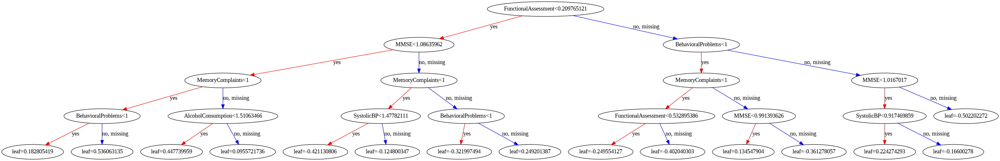

In [ ]:
#cara lain menghitung cover value

booster = model.get_booster()
cover_values = booster.get_score(importance_type='cover')
cover_values


# Generate the dot file and render it
dot_datab = to_graphviz(booster, num_trees=1)

# Render the graph to a PNG file
dot_datab.format = 'png'
dot_datab.render('xgboost_boost_tree')

# Display the graph
from IPython.display import Image
Image(filename='xgboost_boost_tree.png')

<Figure size 5000x4000 with 0 Axes>

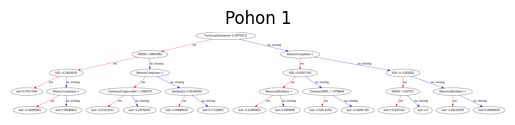

<Figure size 5000x4000 with 0 Axes>

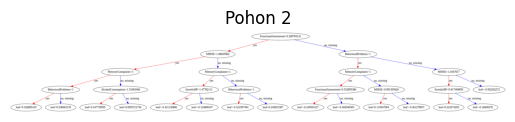

<Figure size 5000x4000 with 0 Axes>

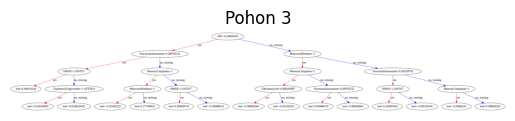

<Figure size 5000x4000 with 0 Axes>

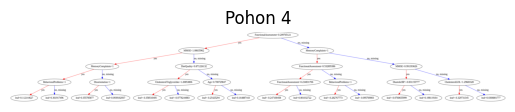

<Figure size 5000x4000 with 0 Axes>

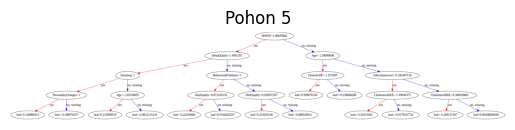

<Figure size 5000x4000 with 0 Axes>

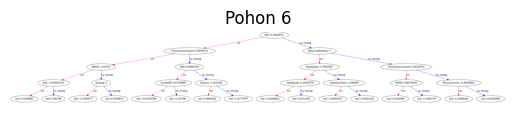

<Figure size 5000x4000 with 0 Axes>

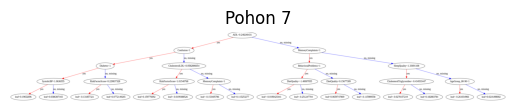

<Figure size 5000x4000 with 0 Axes>

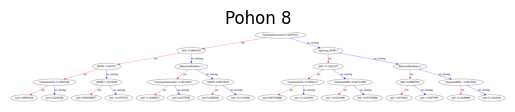

<Figure size 5000x4000 with 0 Axes>

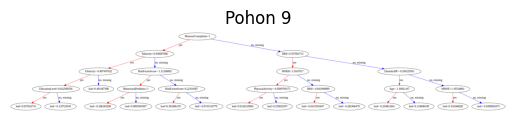

<Figure size 5000x4000 with 0 Axes>

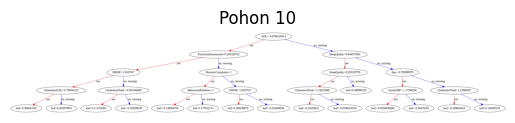

<Figure size 5000x4000 with 0 Axes>

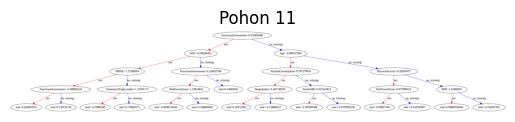

<Figure size 5000x4000 with 0 Axes>

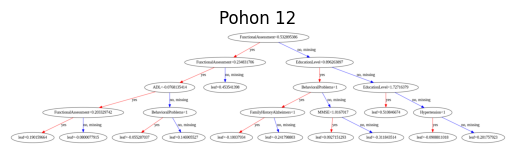

<Figure size 5000x4000 with 0 Axes>

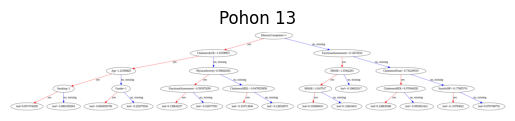

<Figure size 5000x4000 with 0 Axes>

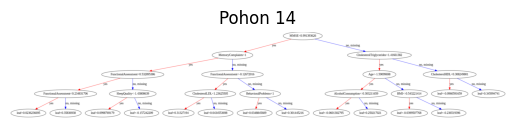

<Figure size 5000x4000 with 0 Axes>

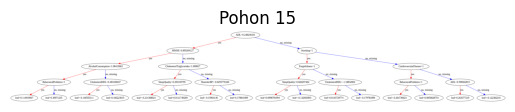

<Figure size 5000x4000 with 0 Axes>

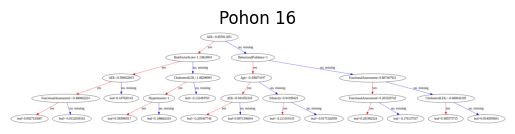

<Figure size 5000x4000 with 0 Axes>

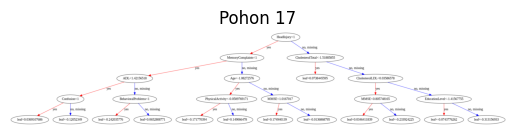

<Figure size 5000x4000 with 0 Axes>

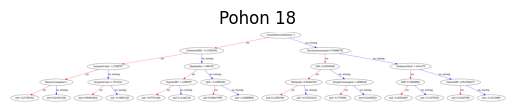

<Figure size 5000x4000 with 0 Axes>

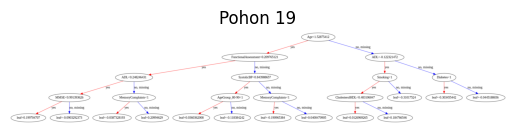

<Figure size 5000x4000 with 0 Axes>

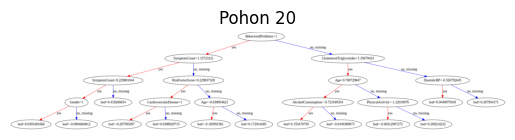

<Figure size 5000x4000 with 0 Axes>

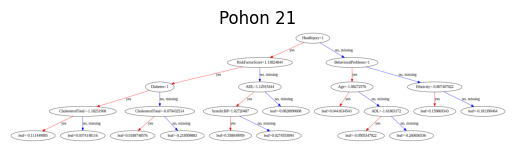

<Figure size 5000x4000 with 0 Axes>

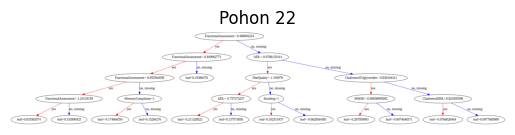

<Figure size 5000x4000 with 0 Axes>

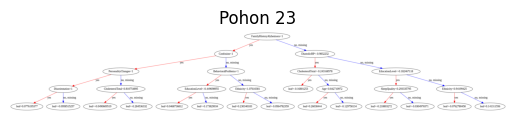

<Figure size 5000x4000 with 0 Axes>

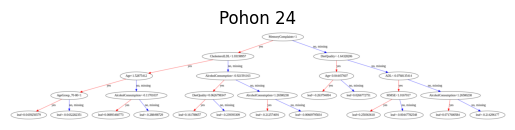

<Figure size 5000x4000 with 0 Axes>

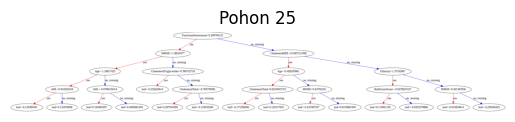

<Figure size 5000x4000 with 0 Axes>

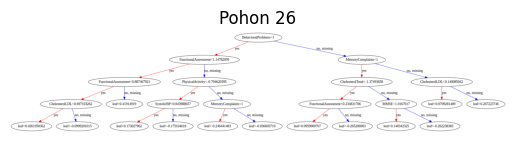

<Figure size 5000x4000 with 0 Axes>

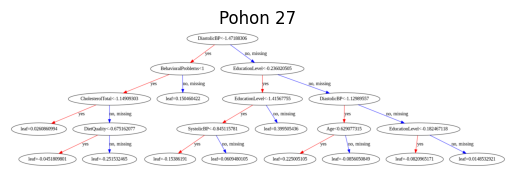

<Figure size 5000x4000 with 0 Axes>

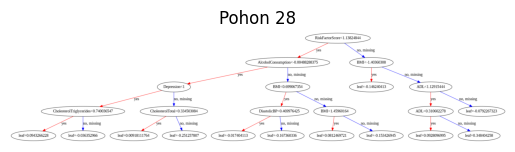

<Figure size 5000x4000 with 0 Axes>

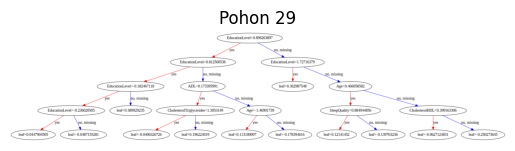

<Figure size 5000x4000 with 0 Axes>

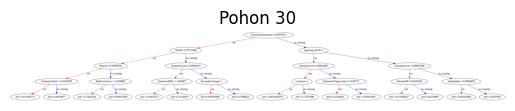

<Figure size 5000x4000 with 0 Axes>

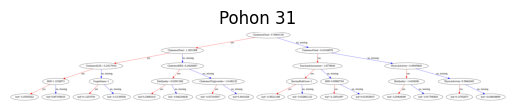

<Figure size 5000x4000 with 0 Axes>

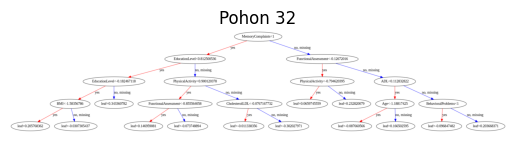

<Figure size 5000x4000 with 0 Axes>

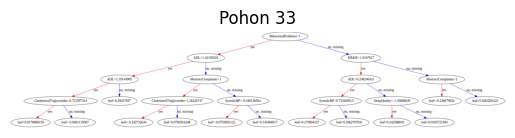

<Figure size 5000x4000 with 0 Axes>

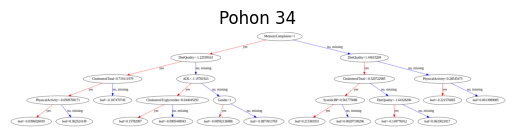

<Figure size 5000x4000 with 0 Axes>

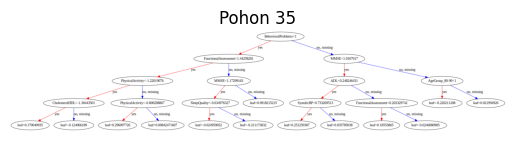

<Figure size 5000x4000 with 0 Axes>

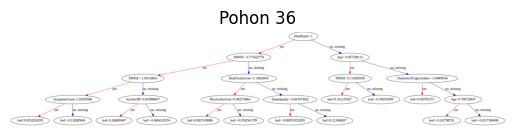

<Figure size 5000x4000 with 0 Axes>

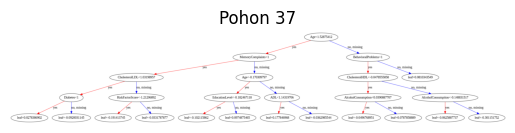

<Figure size 5000x4000 with 0 Axes>

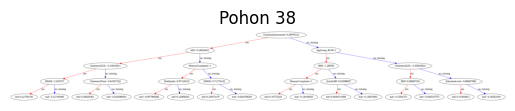

<Figure size 5000x4000 with 0 Axes>

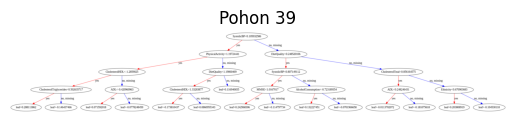

<Figure size 5000x4000 with 0 Axes>

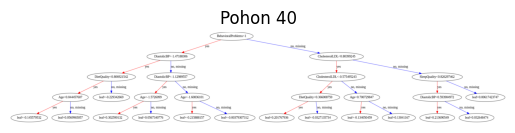

<Figure size 5000x4000 with 0 Axes>

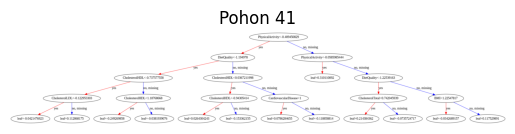

<Figure size 5000x4000 with 0 Axes>

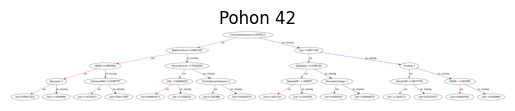

<Figure size 5000x4000 with 0 Axes>

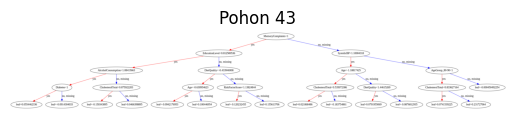

<Figure size 5000x4000 with 0 Axes>

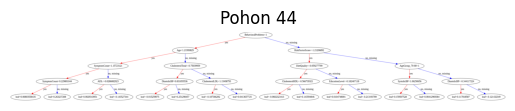

<Figure size 5000x4000 with 0 Axes>

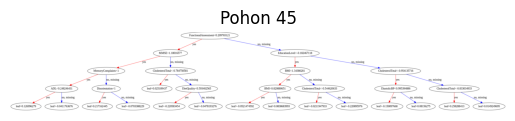

<Figure size 5000x4000 with 0 Axes>

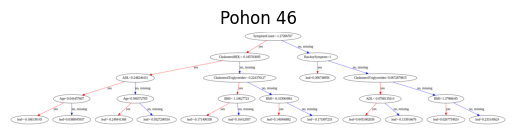

<Figure size 5000x4000 with 0 Axes>

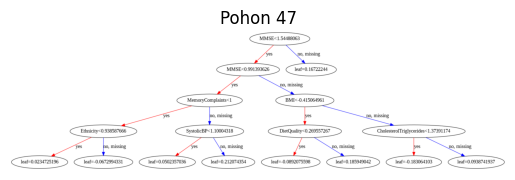

<Figure size 5000x4000 with 0 Axes>

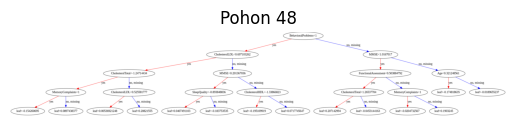

<Figure size 5000x4000 with 0 Axes>

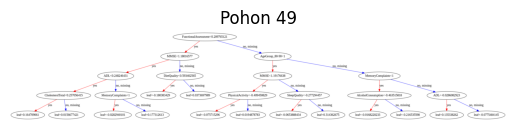

<Figure size 5000x4000 with 0 Axes>

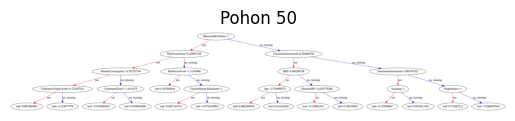

<Figure size 5000x4000 with 0 Axes>

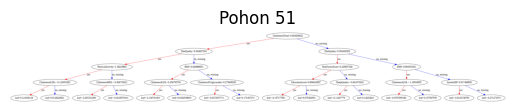

<Figure size 5000x4000 with 0 Axes>

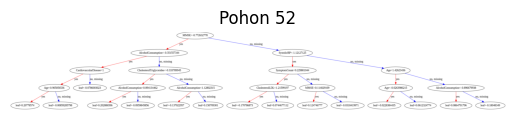

<Figure size 5000x4000 with 0 Axes>

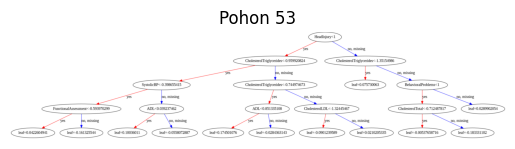

<Figure size 5000x4000 with 0 Axes>

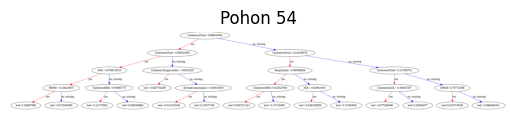

<Figure size 5000x4000 with 0 Axes>

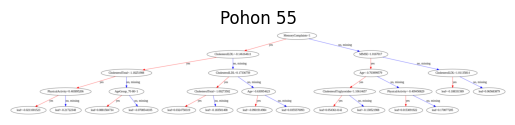

<Figure size 5000x4000 with 0 Axes>

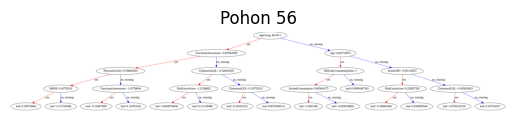

<Figure size 5000x4000 with 0 Axes>

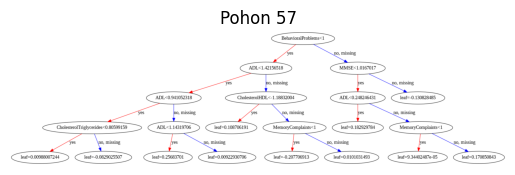

<Figure size 5000x4000 with 0 Axes>

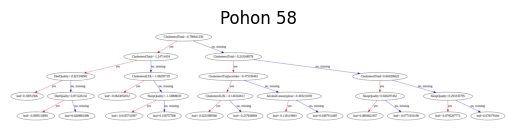

<Figure size 5000x4000 with 0 Axes>

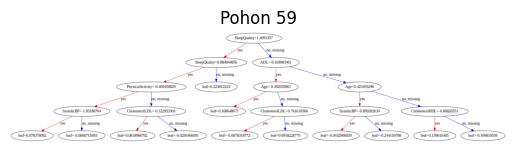

<Figure size 5000x4000 with 0 Axes>

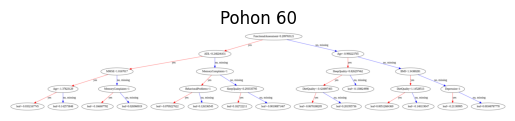

<Figure size 5000x4000 with 0 Axes>

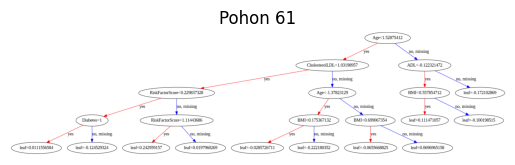

<Figure size 5000x4000 with 0 Axes>

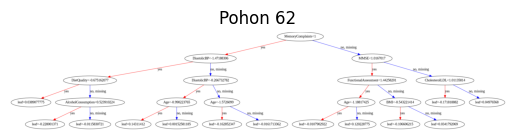

<Figure size 5000x4000 with 0 Axes>

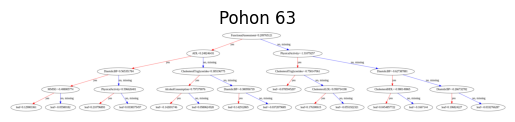

<Figure size 5000x4000 with 0 Axes>

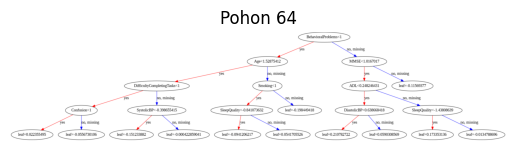

<Figure size 5000x4000 with 0 Axes>

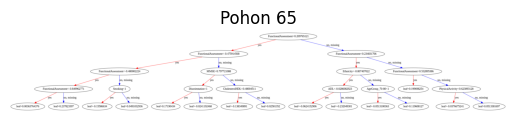

<Figure size 5000x4000 with 0 Axes>

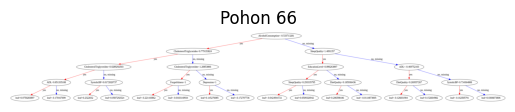

<Figure size 5000x4000 with 0 Axes>

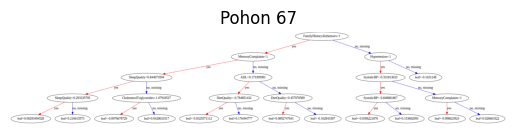

<Figure size 5000x4000 with 0 Axes>

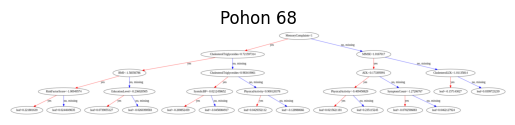

<Figure size 5000x4000 with 0 Axes>

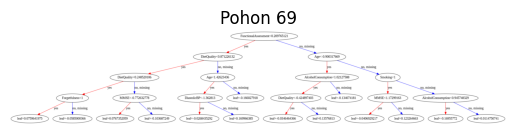

<Figure size 5000x4000 with 0 Axes>

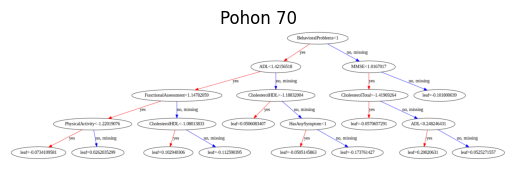

<Figure size 5000x4000 with 0 Axes>

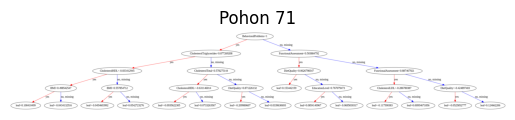

<Figure size 5000x4000 with 0 Axes>

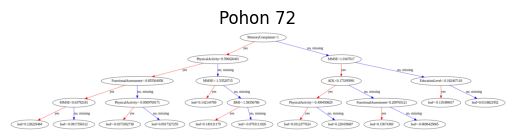

<Figure size 5000x4000 with 0 Axes>

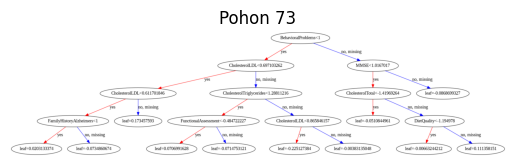

<Figure size 5000x4000 with 0 Axes>

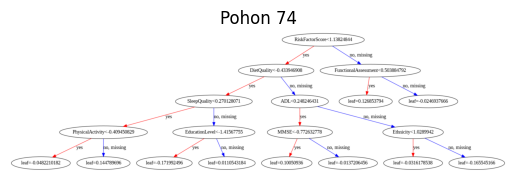

<Figure size 5000x4000 with 0 Axes>

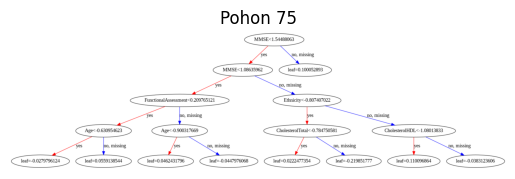

<Figure size 5000x4000 with 0 Axes>

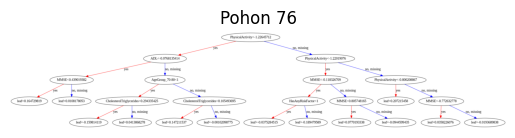

<Figure size 5000x4000 with 0 Axes>

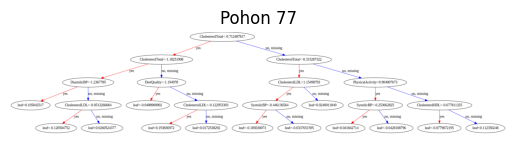

<Figure size 5000x4000 with 0 Axes>

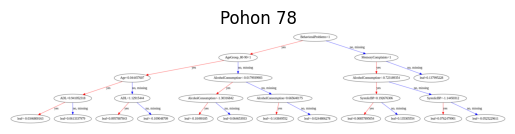

<Figure size 5000x4000 with 0 Axes>

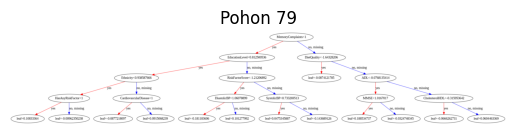

<Figure size 5000x4000 with 0 Axes>

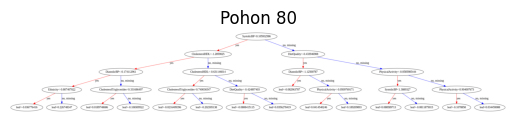

<Figure size 5000x4000 with 0 Axes>

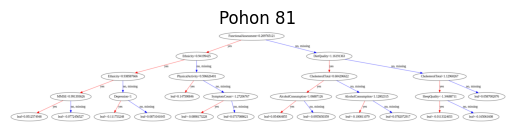

<Figure size 5000x4000 with 0 Axes>

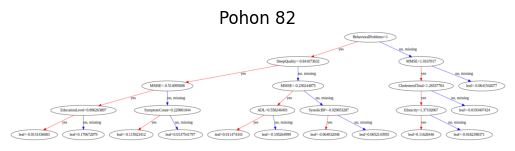

<Figure size 5000x4000 with 0 Axes>

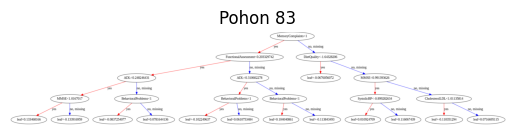

<Figure size 5000x4000 with 0 Axes>

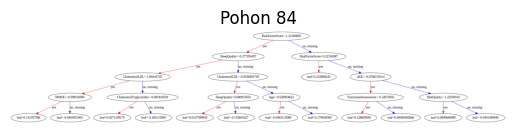

<Figure size 5000x4000 with 0 Axes>

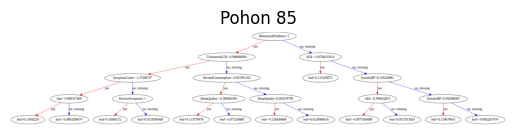

<Figure size 5000x4000 with 0 Axes>

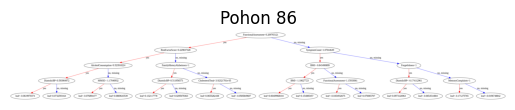

<Figure size 5000x4000 with 0 Axes>

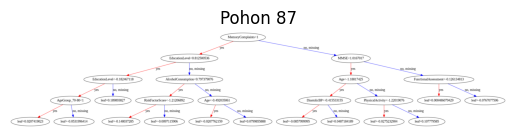

<Figure size 5000x4000 with 0 Axes>

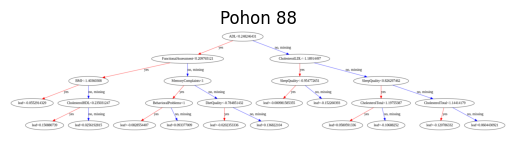

<Figure size 5000x4000 with 0 Axes>

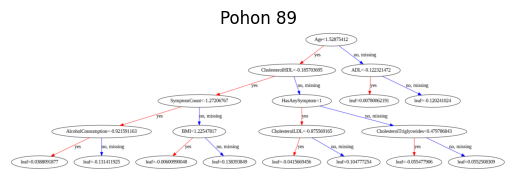

<Figure size 5000x4000 with 0 Axes>

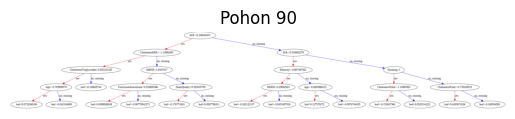

<Figure size 5000x4000 with 0 Axes>

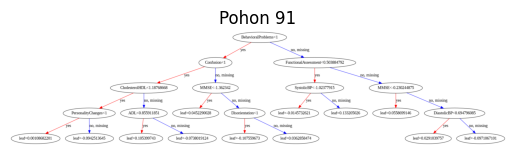

<Figure size 5000x4000 with 0 Axes>

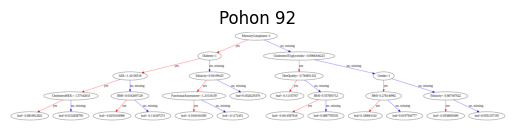

<Figure size 5000x4000 with 0 Axes>

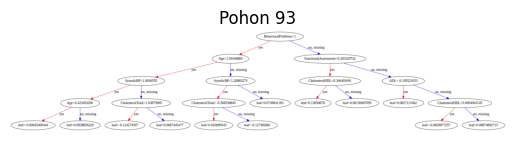

<Figure size 5000x4000 with 0 Axes>

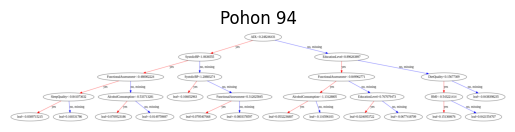

<Figure size 5000x4000 with 0 Axes>

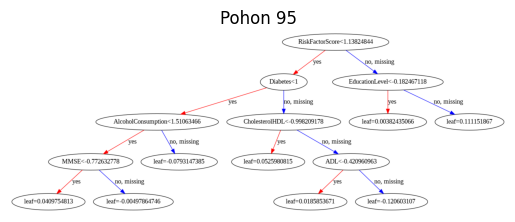

<Figure size 5000x4000 with 0 Axes>

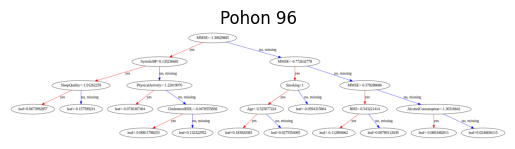

<Figure size 5000x4000 with 0 Axes>

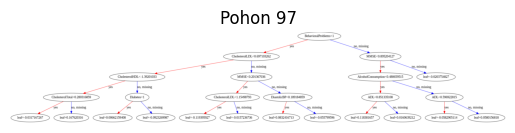

<Figure size 5000x4000 with 0 Axes>

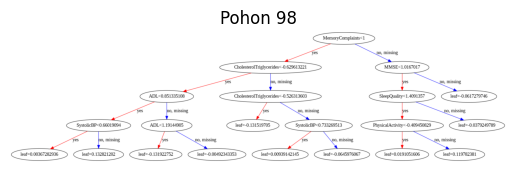

<Figure size 5000x4000 with 0 Axes>

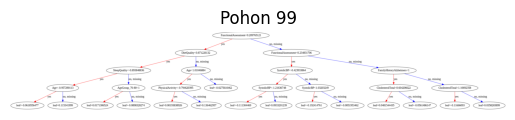

<Figure size 5000x4000 with 0 Axes>

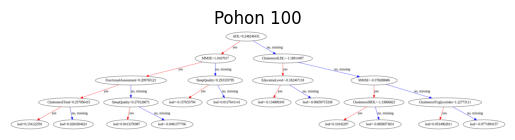

<Figure size 5000x4000 with 0 Axes>

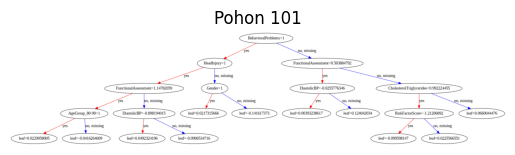

<Figure size 5000x4000 with 0 Axes>

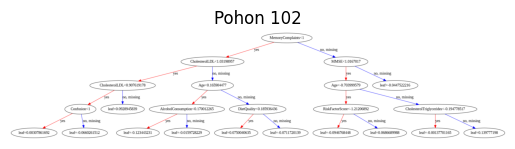

<Figure size 5000x4000 with 0 Axes>

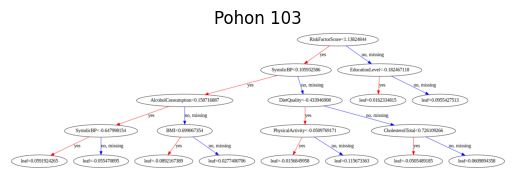

<Figure size 5000x4000 with 0 Axes>

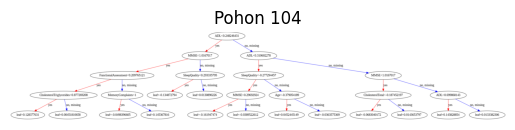

<Figure size 5000x4000 with 0 Axes>

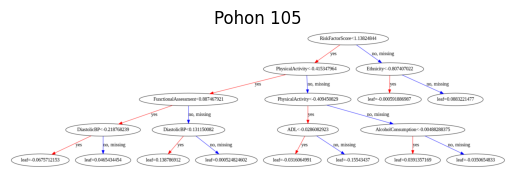

<Figure size 5000x4000 with 0 Axes>

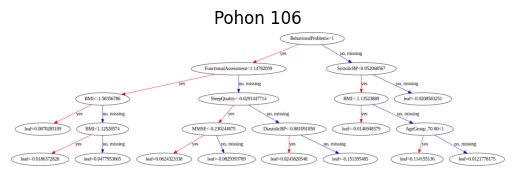

<Figure size 5000x4000 with 0 Axes>

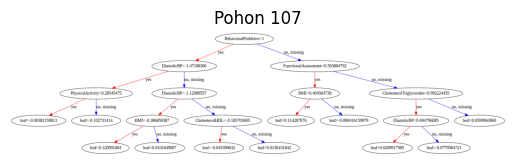

<Figure size 5000x4000 with 0 Axes>

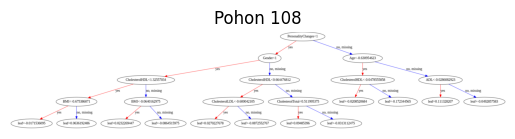

<Figure size 5000x4000 with 0 Axes>

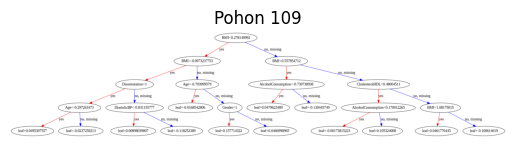

<Figure size 5000x4000 with 0 Axes>

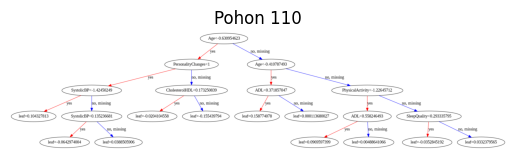

<Figure size 5000x4000 with 0 Axes>

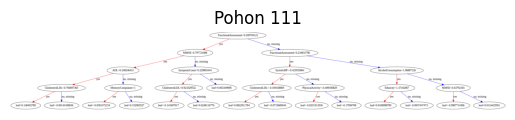

<Figure size 5000x4000 with 0 Axes>

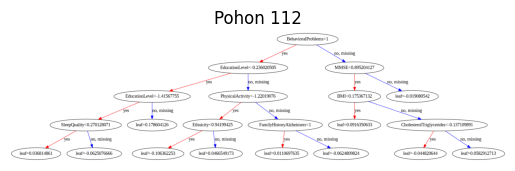

<Figure size 5000x4000 with 0 Axes>

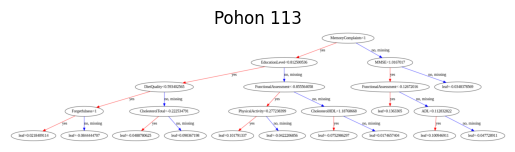

<Figure size 5000x4000 with 0 Axes>

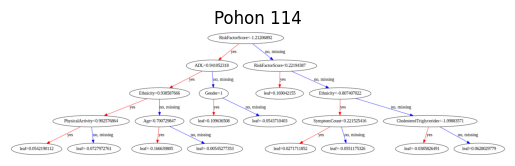

<Figure size 5000x4000 with 0 Axes>

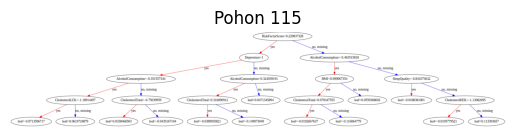

<Figure size 5000x4000 with 0 Axes>

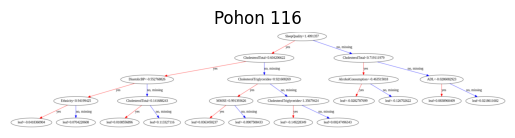

<Figure size 5000x4000 with 0 Axes>

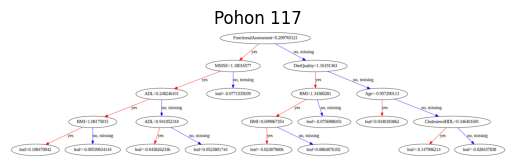

<Figure size 5000x4000 with 0 Axes>

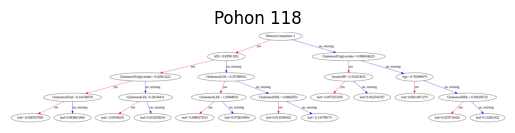

<Figure size 5000x4000 with 0 Axes>

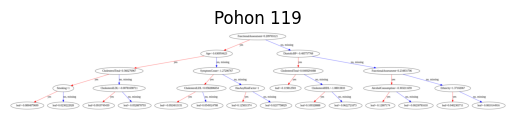

<Figure size 5000x4000 with 0 Axes>

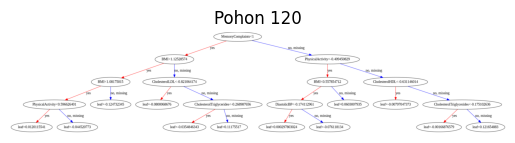

<Figure size 5000x4000 with 0 Axes>

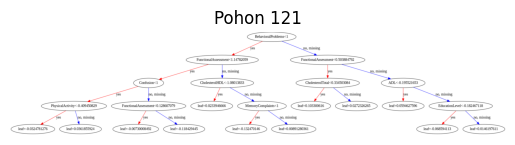

<Figure size 5000x4000 with 0 Axes>

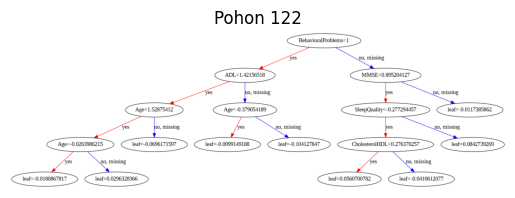

<Figure size 5000x4000 with 0 Axes>

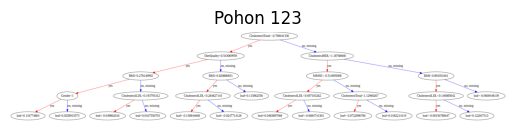

<Figure size 5000x4000 with 0 Axes>

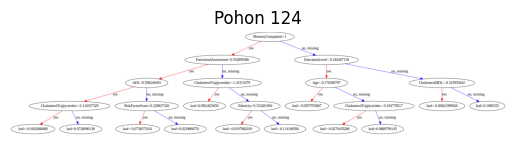

<Figure size 5000x4000 with 0 Axes>

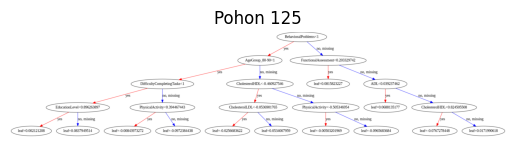

<Figure size 5000x4000 with 0 Axes>

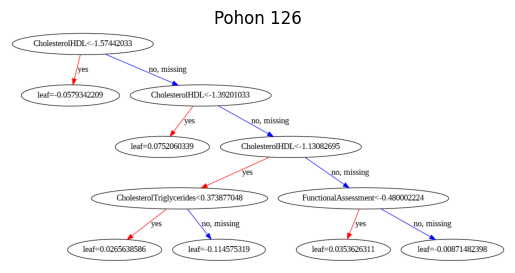

<Figure size 5000x4000 with 0 Axes>

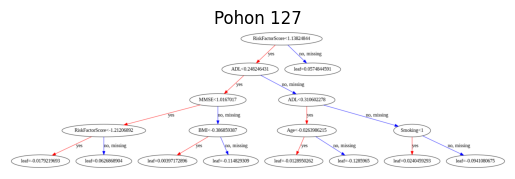

<Figure size 5000x4000 with 0 Axes>

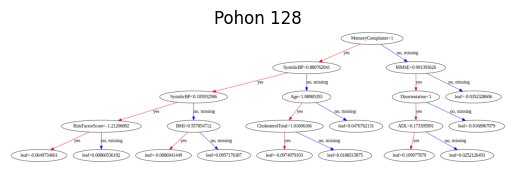

<Figure size 5000x4000 with 0 Axes>

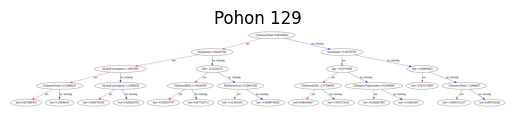

<Figure size 5000x4000 with 0 Axes>

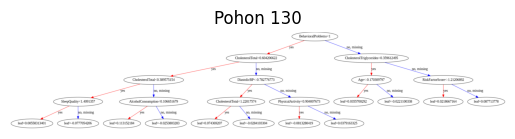

<Figure size 5000x4000 with 0 Axes>

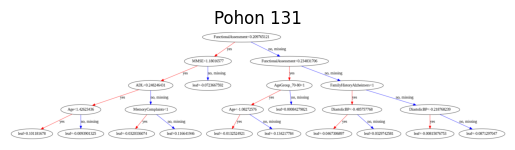

<Figure size 5000x4000 with 0 Axes>

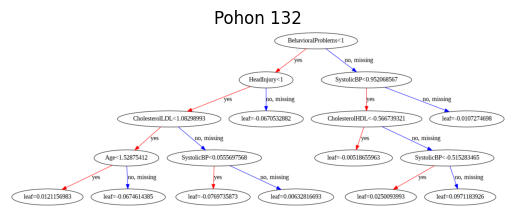

<Figure size 5000x4000 with 0 Axes>

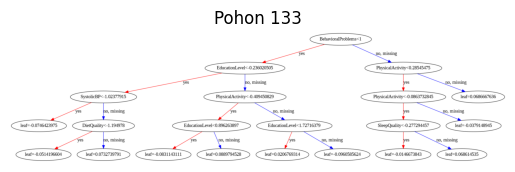

<Figure size 5000x4000 with 0 Axes>

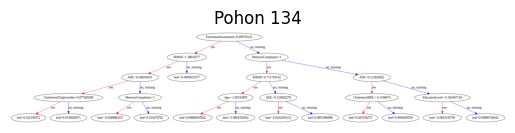

<Figure size 5000x4000 with 0 Axes>

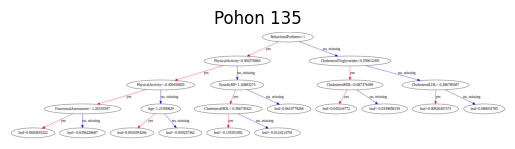

<Figure size 5000x4000 with 0 Axes>

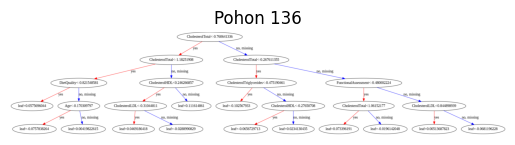

<Figure size 5000x4000 with 0 Axes>

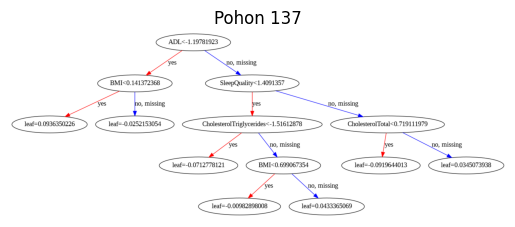

<Figure size 5000x4000 with 0 Axes>

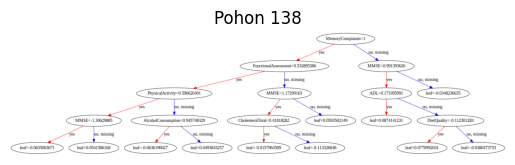

<Figure size 5000x4000 with 0 Axes>

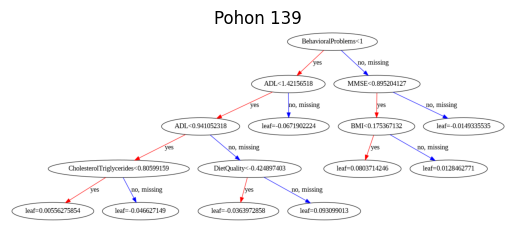

<Figure size 5000x4000 with 0 Axes>

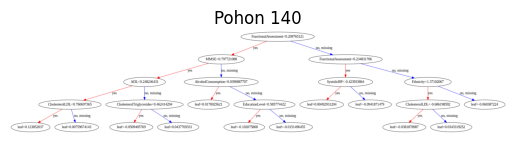

<Figure size 5000x4000 with 0 Axes>

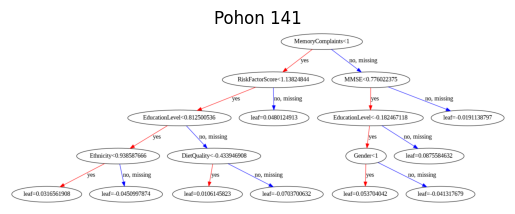

<Figure size 5000x4000 with 0 Axes>

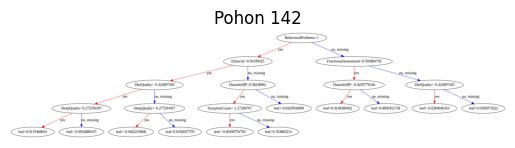

<Figure size 5000x4000 with 0 Axes>

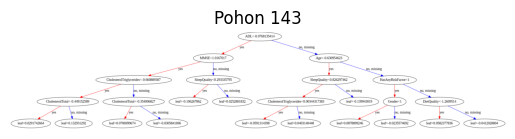

<Figure size 5000x4000 with 0 Axes>

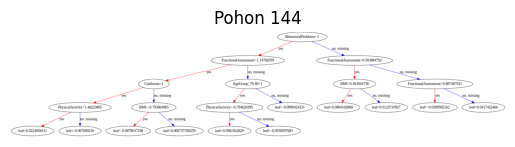

<Figure size 5000x4000 with 0 Axes>

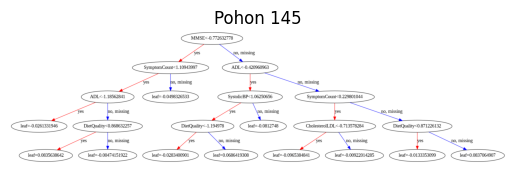

<Figure size 5000x4000 with 0 Axes>

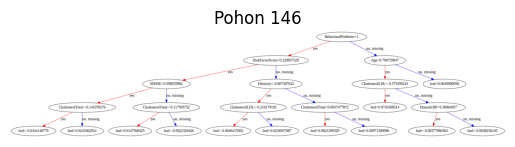

<Figure size 5000x4000 with 0 Axes>

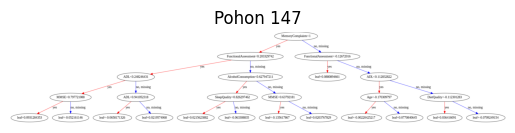

<Figure size 5000x4000 with 0 Axes>

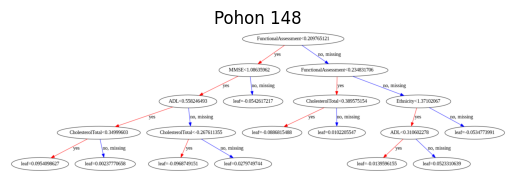

<Figure size 5000x4000 with 0 Axes>

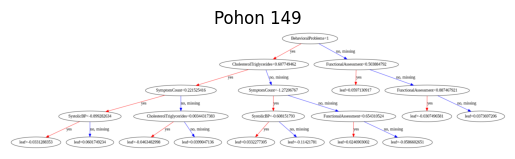

<Figure size 5000x4000 with 0 Axes>

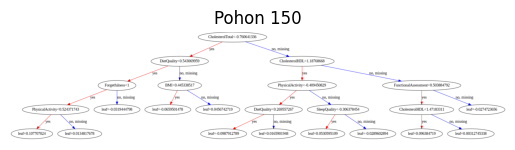

<Figure size 5000x4000 with 0 Axes>

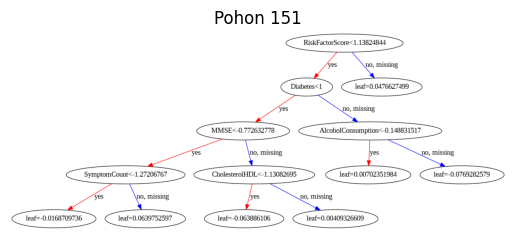

<Figure size 5000x4000 with 0 Axes>

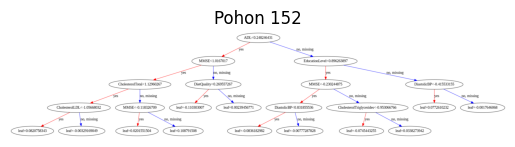

<Figure size 5000x4000 with 0 Axes>

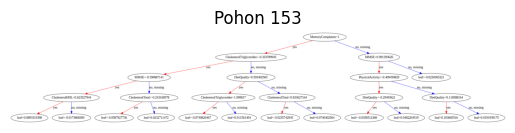

<Figure size 5000x4000 with 0 Axes>

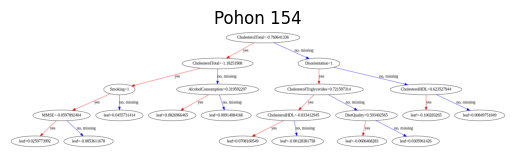

<Figure size 5000x4000 with 0 Axes>

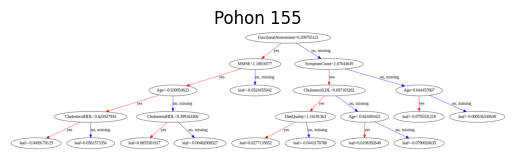

<Figure size 5000x4000 with 0 Axes>

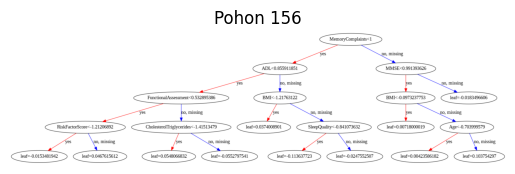

<Figure size 5000x4000 with 0 Axes>

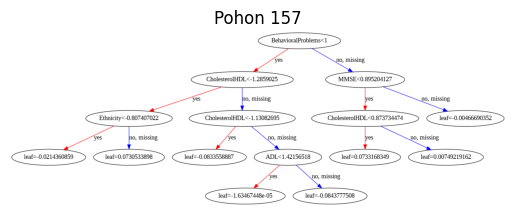

<Figure size 5000x4000 with 0 Axes>

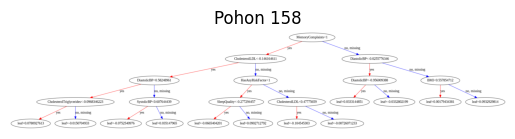

<Figure size 5000x4000 with 0 Axes>

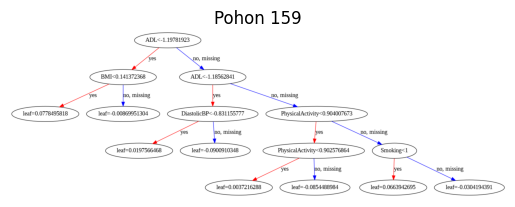

<Figure size 5000x4000 with 0 Axes>

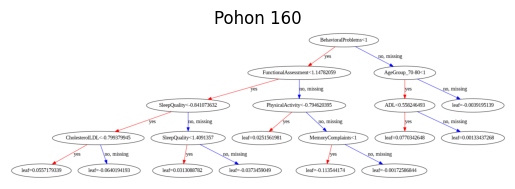

<Figure size 5000x4000 with 0 Axes>

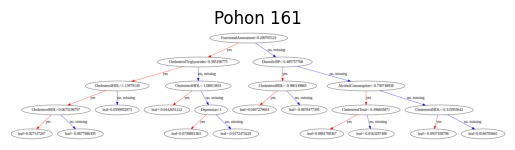

<Figure size 5000x4000 with 0 Axes>

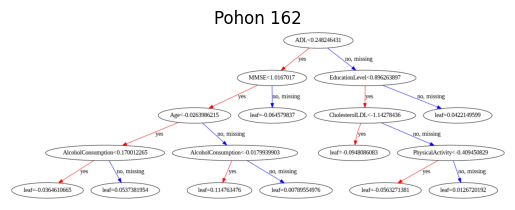

<Figure size 5000x4000 with 0 Axes>

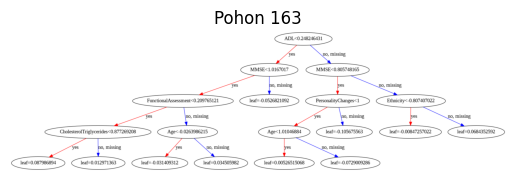

<Figure size 5000x4000 with 0 Axes>

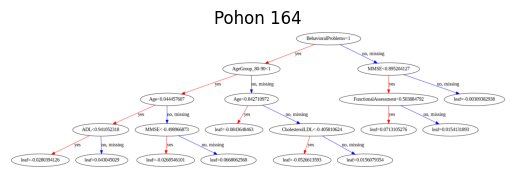

<Figure size 5000x4000 with 0 Axes>

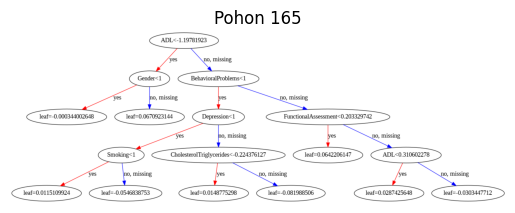

<Figure size 5000x4000 with 0 Axes>

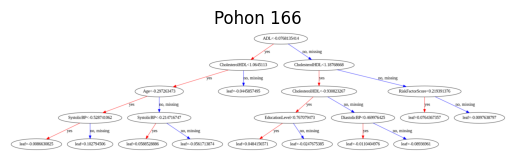

<Figure size 5000x4000 with 0 Axes>

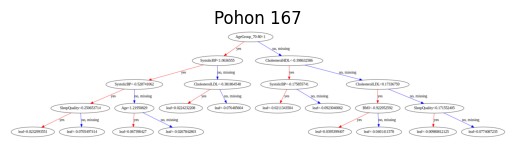

<Figure size 5000x4000 with 0 Axes>

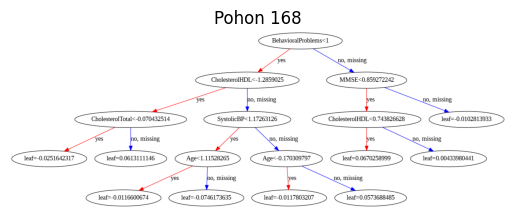

<Figure size 5000x4000 with 0 Axes>

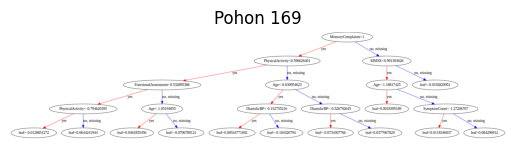

<Figure size 5000x4000 with 0 Axes>

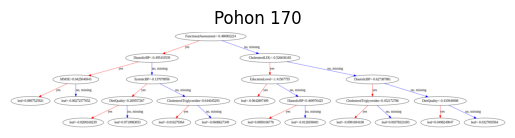

<Figure size 5000x4000 with 0 Axes>

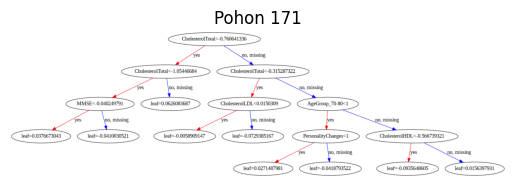

<Figure size 5000x4000 with 0 Axes>

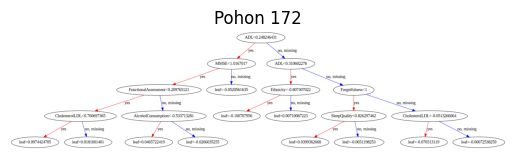

<Figure size 5000x4000 with 0 Axes>

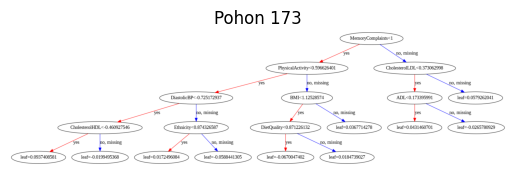

<Figure size 5000x4000 with 0 Axes>

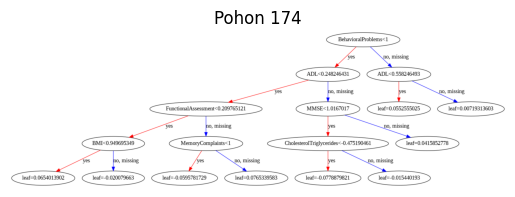

<Figure size 5000x4000 with 0 Axes>

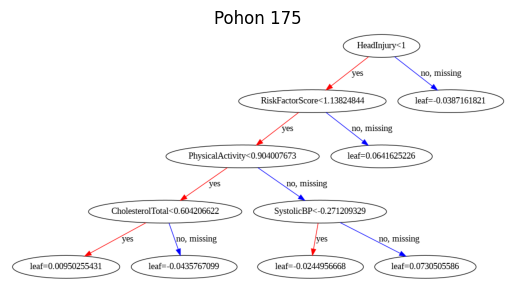

<Figure size 5000x4000 with 0 Axes>

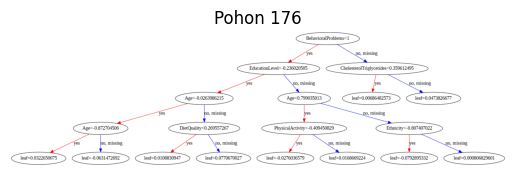

<Figure size 5000x4000 with 0 Axes>

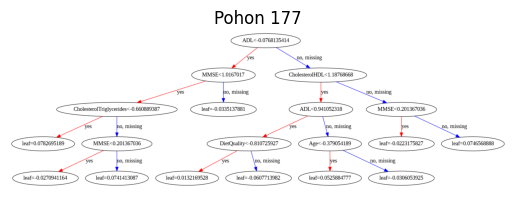

<Figure size 5000x4000 with 0 Axes>

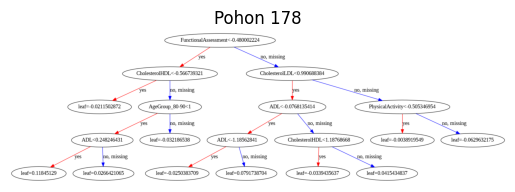

<Figure size 5000x4000 with 0 Axes>

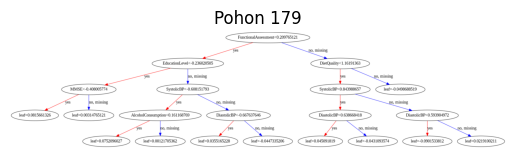

<Figure size 5000x4000 with 0 Axes>

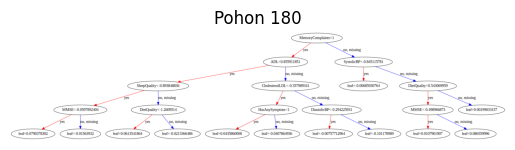

<Figure size 5000x4000 with 0 Axes>

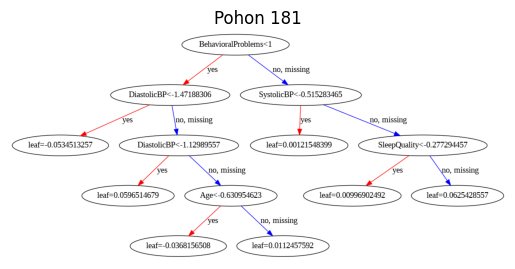

<Figure size 5000x4000 with 0 Axes>

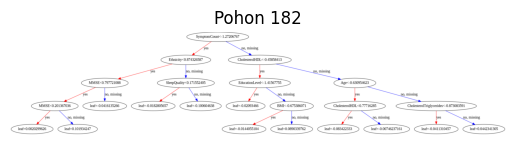

<Figure size 5000x4000 with 0 Axes>

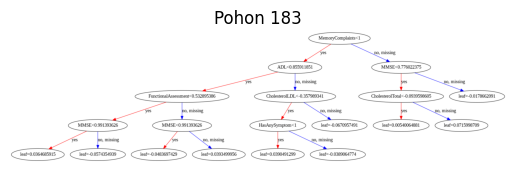

<Figure size 5000x4000 with 0 Axes>

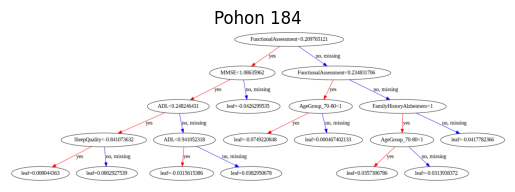

<Figure size 5000x4000 with 0 Axes>

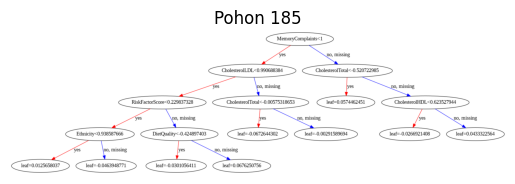

<Figure size 5000x4000 with 0 Axes>

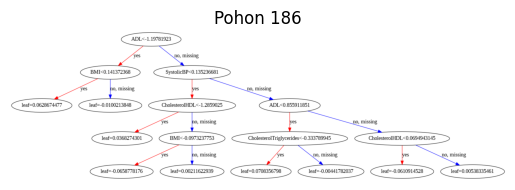

<Figure size 5000x4000 with 0 Axes>

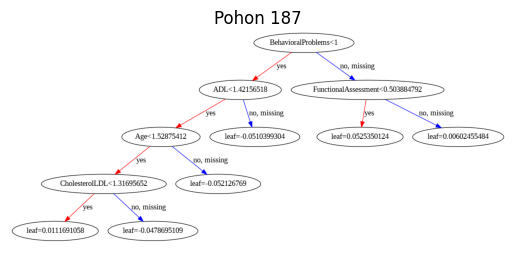

<Figure size 5000x4000 with 0 Axes>

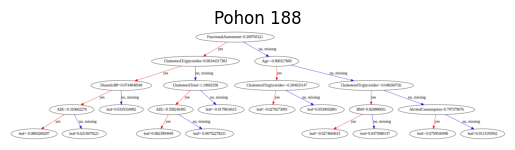

<Figure size 5000x4000 with 0 Axes>

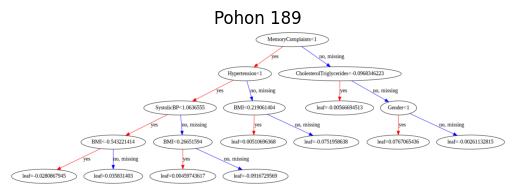

<Figure size 5000x4000 with 0 Axes>

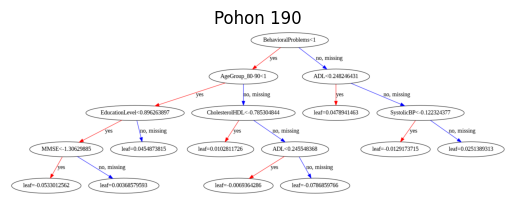

<Figure size 5000x4000 with 0 Axes>

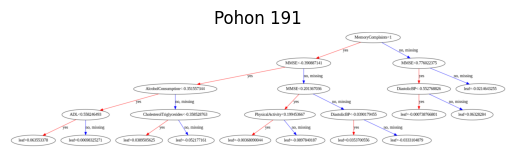

<Figure size 5000x4000 with 0 Axes>

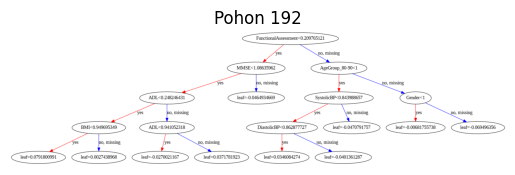

<Figure size 5000x4000 with 0 Axes>

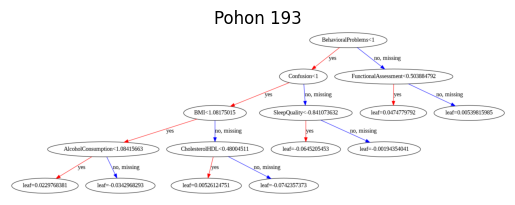

<Figure size 5000x4000 with 0 Axes>

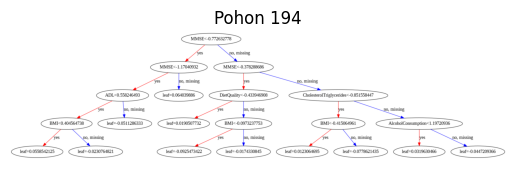

<Figure size 5000x4000 with 0 Axes>

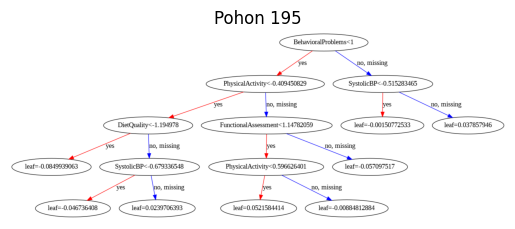

<Figure size 5000x4000 with 0 Axes>

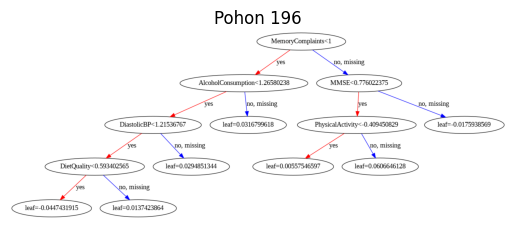

<Figure size 5000x4000 with 0 Axes>

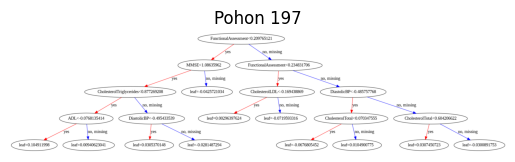

<Figure size 5000x4000 with 0 Axes>

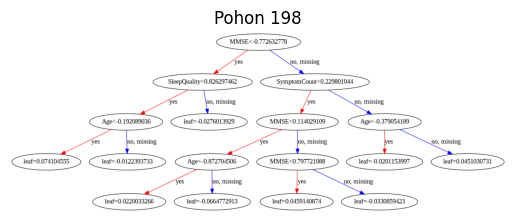

<Figure size 5000x4000 with 0 Axes>

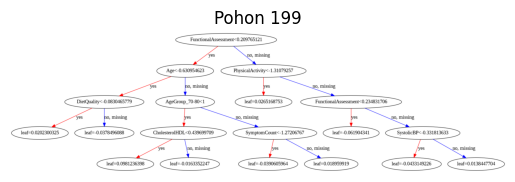

<Figure size 5000x4000 with 0 Axes>

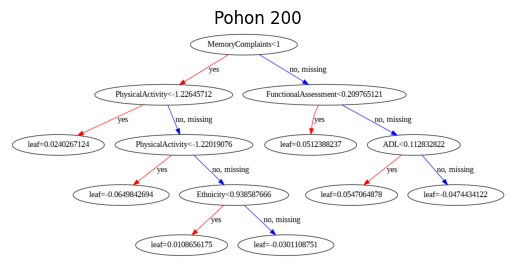

<Figure size 5000x4000 with 0 Axes>

In [ ]:
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV

# Assuming 'model' is your initial XGBoost model
# and 'param_grid' is your hyperparameter grid for GridSearchCV

# Fit the GridSearchCV object to the data
# Replace X_train and y_train with your training data
#grid_search.fit(X_train, y_train) # This line is crucial for obtaining best_params_

# Get the best model parameters from GridSearchCV
best_params = grid_search.best_params_ # Changed to best_params instead of best_model

# Create a new XGBoost model with the best parameters
best_model = xgb.XGBClassifier(**best_params)
# Fit the best model to the training data
best_model.fit(X_train_smote, y_train_smote)

# Access the booster from the best model
booster = best_model.get_booster()

# Get the number of trees
n_estimators = len(booster.get_dump())

# Visualisasi semua pohon berdasarkan n_estimators
for i in range(n_estimators):
    plt.figure(figsize=(50, 40))
    xgb.plot_tree(best_model, num_trees=i)
    plt.title(f'Pohon {i+1}')
    plt.show()

plt.figure(figsize=(50, 40))
xgb.plot_tree(best_model, num_trees=0)
plt.savefig(f'xgboost_tree_{i+1}.eps', format='eps')  # Simpan dalam format EPS yang lebih tajam
plt.close()

In [ ]:
!pip install graphviz
import xgboost as xgb
from graphviz import Source

# Visualisasi beberapa pohon pertama dari model terbaik
num_trees_to_visualize = 5

for i in range(num_trees_to_visualize):
    # Ekspor pohon ke format Graphviz
    dot_data = xgb.to_graphviz(best_params, num_trees=i)

    # Render dan simpan pohon
    source = Source(dot_data, filename=f'xgboost_tree_tuned_{i+1}', format='png')
    source.render()

    print(f"Pohon {i+1} (setelah tuning) disimpan sebagai xgboost_tree_tuned_{i+1}.png")

# Contoh: Visualisasi dan simpan pohon pertama dari model terbaik
dot_data = xgb.to_graphviz(best_params, num_trees=0)
source = Source(dot_data, filename='xgboost_tree_tuned_1', format='png')
source.render()

print("Pohon pertama (setelah tuning) disimpan sebagai xgboost_tree_tuned_1.png")

AttributeError: 'dict' object has no attribute 'get_dump'

In [ ]:
import xgboost as xgb
from graphviz import Source

# Inisialisasi dan latih model XGBoost
xgb_model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', n_estimators=200)
xgb_model.fit(X_train_smote, y_train_smote)

# Visualisasi semua pohon berdasarkan n_estimators menggunakan Graphviz
for i in range(xgb_model.n_estimators):
    # Ekspor pohon ke format Graphviz
    dot_data = xgb.to_graphviz(xgb_model, num_trees=i)

    # Simpan ke file .dot yang dapat divisualisasikan dengan Graphviz
    dot_data.render(f'xgboost_tree_{i+1}', format='png')  # Ganti format jika butuh file vektor seperti .svg atau .eps
    print(f"Pohon {i+1} disimpan sebagai xgboost_tree_{i+1}.png")

# Ekspor dan simpan pohon pertama sebagai contoh
dot_data = xgb.to_graphviz(xgb_model, num_trees=0)
dot_data.render('xgboost_tree_1', format='png')  # Ganti 'png' dengan 'eps' atau 'svg' jika butuh file vektor


Pohon 1 disimpan sebagai xgboost_tree_1.png
Pohon 2 disimpan sebagai xgboost_tree_2.png
Pohon 3 disimpan sebagai xgboost_tree_3.png
Pohon 4 disimpan sebagai xgboost_tree_4.png
Pohon 5 disimpan sebagai xgboost_tree_5.png
Pohon 6 disimpan sebagai xgboost_tree_6.png
Pohon 7 disimpan sebagai xgboost_tree_7.png
Pohon 8 disimpan sebagai xgboost_tree_8.png
Pohon 9 disimpan sebagai xgboost_tree_9.png
Pohon 10 disimpan sebagai xgboost_tree_10.png
Pohon 11 disimpan sebagai xgboost_tree_11.png
Pohon 12 disimpan sebagai xgboost_tree_12.png
Pohon 13 disimpan sebagai xgboost_tree_13.png
Pohon 14 disimpan sebagai xgboost_tree_14.png
Pohon 15 disimpan sebagai xgboost_tree_15.png
Pohon 16 disimpan sebagai xgboost_tree_16.png
Pohon 17 disimpan sebagai xgboost_tree_17.png
Pohon 18 disimpan sebagai xgboost_tree_18.png
Pohon 19 disimpan sebagai xgboost_tree_19.png
Pohon 20 disimpan sebagai xgboost_tree_20.png
Pohon 21 disimpan sebagai xgboost_tree_21.png
Pohon 22 disimpan sebagai xgboost_tree_22.png
Pohon 

'xgboost_tree_1.png'

In [ ]:
!pip install graphviz

import xgboost as xgb
from graphviz import Source
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/drive')

# Inisialisasi dan latih model XGBoost
xgb_model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', n_estimators=200)
xgb_model.fit(X_train_smote, y_train_smote)

# Specify the path to save images in your Google Drive
save_path = '/content/drive/My Drive/XGBoost_Plots/'  # Change 'XGBoost_Plots' to your desired folder name

# Visualisasi semua pohon berdasarkan n_estimators menggunakan Graphviz
for i in range(xgb_model.n_estimators):
    # Ekspor pohon ke format Graphviz
    dot_data = xgb.to_graphviz(xgb_model, num_trees=i)

    # Render dan simpan pohon di Google Drive
    # The Source object is not needed for rendering to a file
    # Instead, use the render method of the dot_data object directly
    dot_data.render(filename=f'{save_path}xgboost_tree_{i+1}', format='png')

    print(f"Pohon {i+1} disimpan sebagai {save_path}xgboost_tree_{i+1}.png")

# Ekspor dan simpan pohon pertama sebagai contoh di Google Drive
dot_data = xgb.to_graphviz(xgb_model, num_trees=0)
# Render and save the first tree
dot_data.render(filename=f'{save_path}xgboost_tree_1', format='png')

print(f"Pohon pertama disimpan sebagai {save_path}xgboost_tree_1.png")

Mounted at /content/drive
Pohon 1 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_1.png
Pohon 2 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_2.png
Pohon 3 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_3.png
Pohon 4 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_4.png
Pohon 5 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_5.png
Pohon 6 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_6.png
Pohon 7 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_7.png
Pohon 8 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_8.png
Pohon 9 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_9.png
Pohon 10 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_10.png
Pohon 11 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgboost_tree_11.png
Pohon 12 disimpan sebagai /content/drive/My Drive/XGBoost_Plots/xgbo

In [ ]:
from sklearn.metrics import accuracy_score
import xgboost as xgb

# Inisialisasi dan latih model XGBoost
xgb_model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', n_estimators=200)
xgb_model.fit(X_train_smote, y_train_smote)

# Get the best model parameters from GridSearchCV (Assuming you have already run GridSearchCV)
best_params = grid_search.best_params_

# Create a new XGBoost model with the best parameters
best_model = xgb.XGBClassifier(**best_params)

# Fit the best model to the training data
best_model.fit(X_train_smote, y_train_smote)

# Melakukan prediksi menggunakan model setelah hyperparameter tuning
y_pred = best_model.predict(X_test)  # Assign the predictions to y_pred

# Iterasi untuk mengevaluasi performa setelah setiap pohon
for i in range(1, xgb_model.n_estimators + 1):
    # Prediksi menggunakan pohon sampai iterasi ke-i
    preds = xgb_model.predict(X_test)
    # Menghitung akurasi pada set validasi sebelum hyperparameter
    accuracy1 = accuracy_score(y_test, preds)
    print(f"Akurasi setelah {i} pohon: {accuracy1}")
    # Menghitung akurasi pada set validasi setelah hyperparameter
    accuracy2 = accuracy_score(y_test, y_pred)  # Now y_pred is defined
    print(f"Akurasi setelah {i} pohon (hyperparameter): {accuracy2}")

Akurasi setelah 1 pohon: 0.9418604651162791
Akurasi setelah 1 pohon (hyperparameter): 0.9395348837209302
Akurasi setelah 2 pohon: 0.9418604651162791
Akurasi setelah 2 pohon (hyperparameter): 0.9395348837209302
Akurasi setelah 3 pohon: 0.9418604651162791
Akurasi setelah 3 pohon (hyperparameter): 0.9395348837209302
Akurasi setelah 4 pohon: 0.9418604651162791
Akurasi setelah 4 pohon (hyperparameter): 0.9395348837209302
Akurasi setelah 5 pohon: 0.9418604651162791
Akurasi setelah 5 pohon (hyperparameter): 0.9395348837209302
Akurasi setelah 6 pohon: 0.9418604651162791
Akurasi setelah 6 pohon (hyperparameter): 0.9395348837209302
Akurasi setelah 7 pohon: 0.9418604651162791
Akurasi setelah 7 pohon (hyperparameter): 0.9395348837209302
Akurasi setelah 8 pohon: 0.9418604651162791
Akurasi setelah 8 pohon (hyperparameter): 0.9395348837209302
Akurasi setelah 9 pohon: 0.9418604651162791
Akurasi setelah 9 pohon (hyperparameter): 0.9395348837209302
Akurasi setelah 10 pohon: 0.9418604651162791
Akurasi se

In [ ]:
#cara lain menghitung gain value

gain_values = booster.get_score(importance_type='gain')
gain_values

{'Age': 0.9558202624320984,
 'Ethnicity': 1.5414854288101196,
 'EducationLevel': 1.7606314420700073,
 'BMI': 0.774113655090332,
 'AlcoholConsumption': 0.8079225420951843,
 'PhysicalActivity': 0.8143296241760254,
 'DietQuality': 1.0011470317840576,
 'SleepQuality': 1.7347482442855835,
 'SystolicBP': 0.7757455706596375,
 'DiastolicBP': 0.8202139735221863,
 'CholesterolTotal': 0.9756115674972534,
 'CholesterolLDL': 0.7929179072380066,
 'CholesterolHDL': 0.7436816096305847,
 'CholesterolTriglycerides': 0.8569383025169373,
 'MMSE': 5.591089725494385,
 'FunctionalAssessment': 8.740761756896973,
 'ADL': 5.444437026977539,
 'RiskFactorScore': 1.4321880340576172,
 'SymptomCount': 1.5456252098083496,
 'Gender': 0.7009671926498413,
 'Smoking': 2.1527554988861084,
 'FamilyHistoryAlzheimers': 1.1968544721603394,
 'CardiovascularDisease': 1.5763437747955322,
 'Diabetes': 1.5012850761413574,
 'Depression': 1.014904260635376,
 'HeadInjury': 1.66694176197052,
 'Hypertension': 0.9127207398414612,
 'Memo

In [ ]:
#cara lain menghitung Leaf Output

leaf_outputs = booster.get_dump()[0]  # Get the tree structure
leaf_outputs

'0:[FunctionalAssessment<0.209765121] yes=1,no=2,missing=2\n\t1:[MMSE<1.08635962] yes=3,no=4,missing=4\n\t\t3:[ADL<0.248246431] yes=7,no=8,missing=8\n\t\t\t7:leaf=0.570175469\n\t\t\t8:[MemoryComplaints<1] yes=15,no=16,missing=16\n\t\t\t\t15:leaf=-0.184905663\n\t\t\t\t16:leaf=0.550000012\n\t\t4:[MemoryComplaints<1] yes=9,no=10,missing=10\n\t\t\t9:[CholesterolTriglycerides<1.33965576] yes=17,no=18,missing=18\n\t\t\t\t17:leaf=-0.551612914\n\t\t\t\t18:leaf=-0.230769247\n\t\t\t10:[DietQuality<0.593402565] yes=19,no=20,missing=20\n\t\t\t\t19:leaf=-0.450000018\n\t\t\t\t20:leaf=0.171428591\n\t2:[MemoryComplaints<1] yes=5,no=6,missing=6\n\t\t5:[ADL<0.039237462] yes=11,no=12,missing=12\n\t\t\t11:[BehavioralProblems<1] yes=21,no=22,missing=22\n\t\t\t\t21:leaf=-0.441800654\n\t\t\t\t22:leaf=0.25090909\n\t\t\t12:[CholesterolHDL<1.18768668] yes=23,no=24,missing=24\n\t\t\t\t23:leaf=-0.528143764\n\t\t\t\t24:leaf=-0.342857182\n\t\t6:[ADL<0.112832822] yes=13,no=14,missing=14\n\t\t\t13:[MMSE<1.0167017] ye

In [ ]:
log_odds = np.log(y_train_pred / (1 - y_train_pred))
log_odds


<ipython-input-65-690a8f240a07>:1: RuntimeWarning: divide by zero encountered in divide
  log_odds = np.log(y_train_pred / (1 - y_train_pred))
<ipython-input-65-690a8f240a07>:1: RuntimeWarning: divide by zero encountered in log
  log_odds = np.log(y_train_pred / (1 - y_train_pred))


array([-inf, -inf,  inf, ...,  inf,  inf,  inf])

In [ ]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Applying sigmoid to the predicted log odds
probabilities = sigmoid(log_odds)
probabilities

array([0., 0., 1., ..., 1., 1., 1.])

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Mendapatkan model terbaik dari hasil GridSearchCV atau RandomizedSearchCV
best_model = grid_search.best_estimator_

# Melakukan prediksi pada data uji
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probabilitas kelas positif

# Menghitung metrik evaluasi
cm = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Menampilkan hasil metrik
print("Confusion Matrix:\n", cm)
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("ROC AUC:", roc_auc)

Confusion Matrix:
 [[263  15]
 [ 11 141]]
Accuracy: 0.9395348837209302
Precision: 0.9038461538461539
Recall: 0.9276315789473685
F1 Score: 0.9155844155844156
ROC AUC: 0.9418070806512685


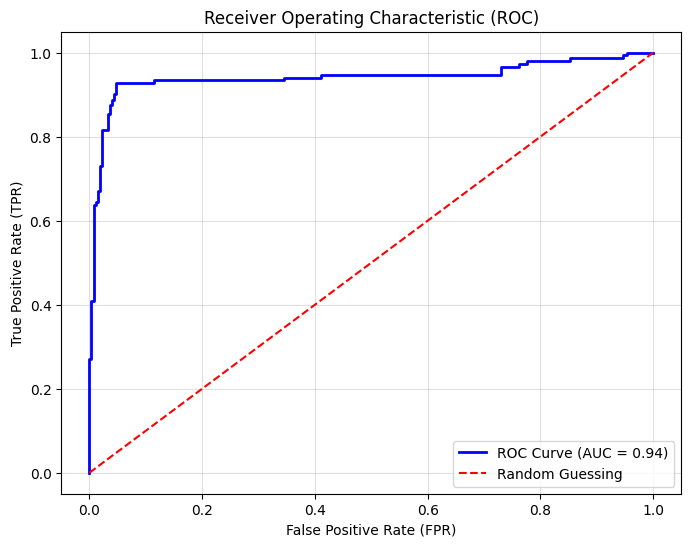

In [ ]:
# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random Guessing')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.grid(alpha=0.4)
plt.show()

{'alpha': 0, 'colsample_bylevel': 0.8, 'colsample_bytree': 0.8, 'gamma': 0, 'lambda': 1, 'learning_rate': 0.3, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 1.0}
XGBClassifier(alpha=0, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=0.8, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0, grow_policy=None,
              importance_type=None, interaction_constraints=None, lambda=1,
              learning_rate=0.3, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=4,
              max_leaves=None, min_child_weight=1, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, ...)
0.9995499549954996 0.9395348837209302
451     1
2080    1
1656    1
1070    1
830    

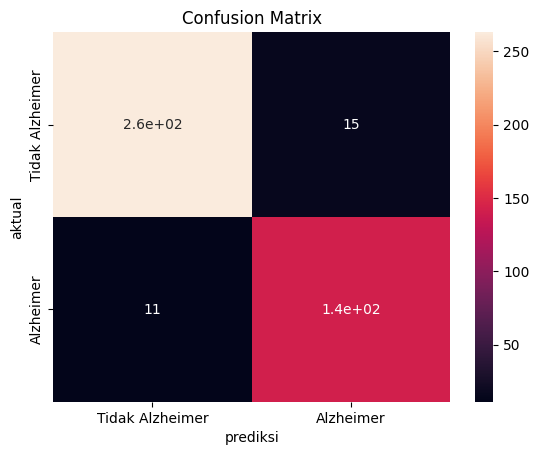

In [ ]:
# =========== Model Evalutation ===========
print(best_params)
print(best_model)
print(model.score(X_train_smote, y_train_smote), model.score(X_test, y_test))

print(y_test, y_pred)
print()
print('Accuracy: ', accuracy_score(y_test, y_pred))
print()

# =========== Confusion Matrix Visualization ===========
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
# =========== Confusion Matrix Visualization ===========
cm = confusion_matrix(y_test, y_pred)
ax = plt.subplot()
sns.heatmap(cm, annot=True, ax=ax)

ax.set_ylabel('aktual')
ax.set_xlabel('prediksi')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['Tidak Alzheimer','Alzheimer'])
ax.yaxis.set_ticklabels(['Tidak Alzheimer','Alzheimer'])
print('Confusion Matrix: \n', confusion_matrix(y_test, y_pred))

In [ ]:
evals_result = {}

bst = xgb.train(params, dtrain, num_boost_round=100, evals=[(dtrain, 'train'), (dtest, 'test')], evals_result=evals_result, verbose_eval=False)

# Menampilkan training loss dan test loss
print("Training Loss: ", evals_result['train']['logloss'])
print("Test Loss: ", evals_result['test']['logloss'])


Training Loss:  [0.5247905540584338, 0.4533890076954015, 0.3758182706433733, 0.34155841217343597, 0.3268257643755871, 0.29234376683844626, 0.2761045797324792, 0.2575727702411014, 0.24558116736529273, 0.23105793619154544, 0.2203367525798836, 0.2118858601763831, 0.2052657315155456, 0.1986628457213124, 0.1908429764340272, 0.18454067511014594, 0.1801920673004364, 0.1743490647285268, 0.1695122406870365, 0.1643980417126483, 0.16090692294460598, 0.15550928132698227, 0.15165515546791733, 0.14818288241847336, 0.1436164201442953, 0.13969137528997155, 0.13626000136716465, 0.13336870586279526, 0.12881758401410748, 0.12484500941053527, 0.12104065585503725, 0.1173057740503236, 0.11487294622997876, 0.11230809832115751, 0.11012984203400206, 0.10824457942165516, 0.1065543820980219, 0.10320765749348808, 0.09921505199211422, 0.0974785738494857, 0.09503704516272281, 0.09227026960629975, 0.09047962530330568, 0.08854820416890492, 0.08654226904509316, 0.08329495662584752, 0.08200651572236439, 0.0801241740975

In [ ]:
# Daftar semua fitur dari dataset (misalnya menggunakan fitur dari dtrain)
all_features = dtrain.feature_names

# Mendapatkan booster object dari model XGBClassifier
booster = model.get_booster()

# Mendapatkan nilai Gain, Cover, dan Frequency untuk fitur yang digunakan
importance_gain = booster.get_score(importance_type='gain')  # Gain
importance_cover = booster.get_score(importance_type='cover')  # Cover
importance_frequency = booster.get_score(importance_type='weight')  # Frequency (Weight)

# Inisialisasi dictionary dengan semua fitur dan nilai default 0
importance_gain = {feature: importance_gain.get(feature, 0) for feature in all_features}
importance_cover = {feature: importance_cover.get(feature, 0) for feature in all_features}
importance_frequency = {feature: importance_frequency.get(feature, 0) for feature in all_features}

# Menampilkan hasil untuk setiap fitur
print("Feature Importance by Gain:")
for feature, value in importance_gain.items():
    print(f"{feature}: {value}")

print("\nFeature Importance by Cover:")
for feature, value in importance_cover.items():
    print(f"{feature}: {value}")

print("\nFeature Importance by Frequency (Weight):")
for feature, value in importance_frequency.items():
    print(f"{feature}: {value}")

Feature Importance by Gain:
Age: 1.6049622297286987
Ethnicity: 2.8049845695495605
EducationLevel: 2.654169797897339
BMI: 1.4524478912353516
AlcoholConsumption: 1.2111767530441284
PhysicalActivity: 1.4007011651992798
DietQuality: 1.5455238819122314
SleepQuality: 2.7006986141204834
SystolicBP: 1.194717288017273
DiastolicBP: 1.60455322265625
CholesterolTotal: 1.6003919839859009
CholesterolLDL: 1.279531717300415
CholesterolHDL: 1.4134572744369507
CholesterolTriglycerides: 1.5226919651031494
MMSE: 9.561461448669434
FunctionalAssessment: 15.034198760986328
ADL: 9.789276123046875
RiskFactorScore: 2.221508264541626
SymptomCount: 2.7535502910614014
Gender: 2.095285654067993
Smoking: 2.9038596153259277
FamilyHistoryAlzheimers: 1.5409672260284424
CardiovascularDisease: 1.5763437747955322
Diabetes: 1.6584997177124023
Depression: 1.552063226699829
HeadInjury: 2.827208995819092
Hypertension: 1.1975005865097046
MemoryComplaints: 10.218002319335938
BehavioralProblems: 7.017035484313965
Confusion: 2.83

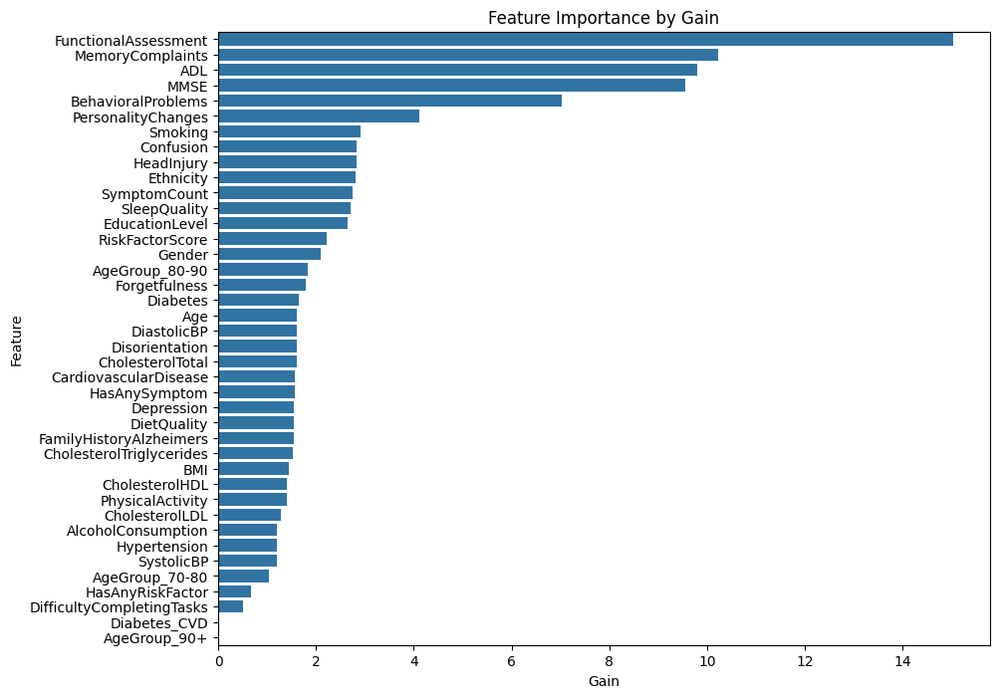

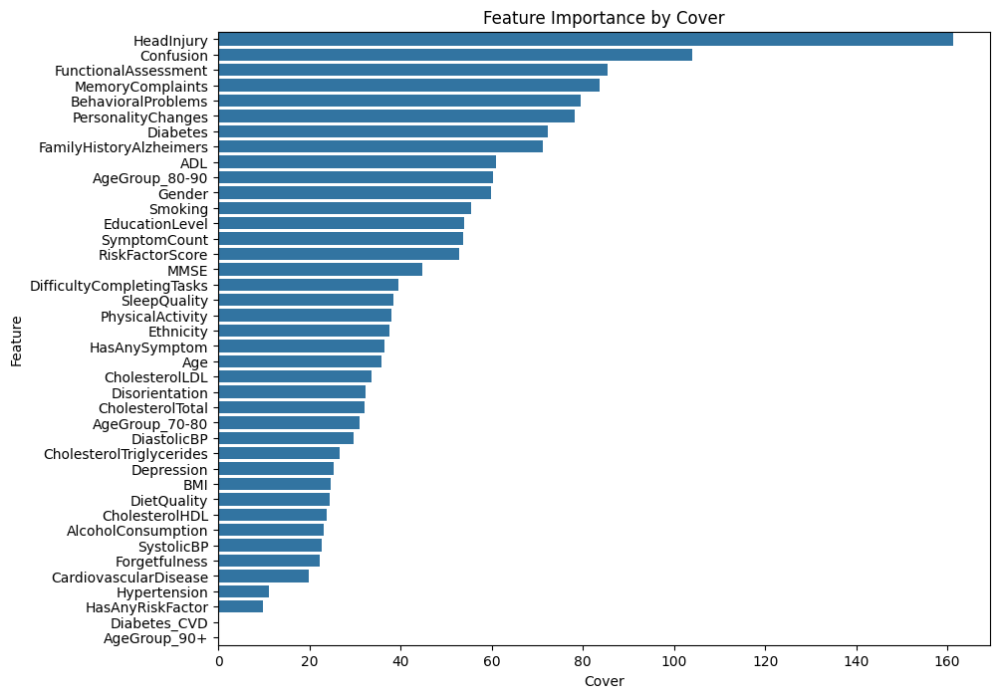

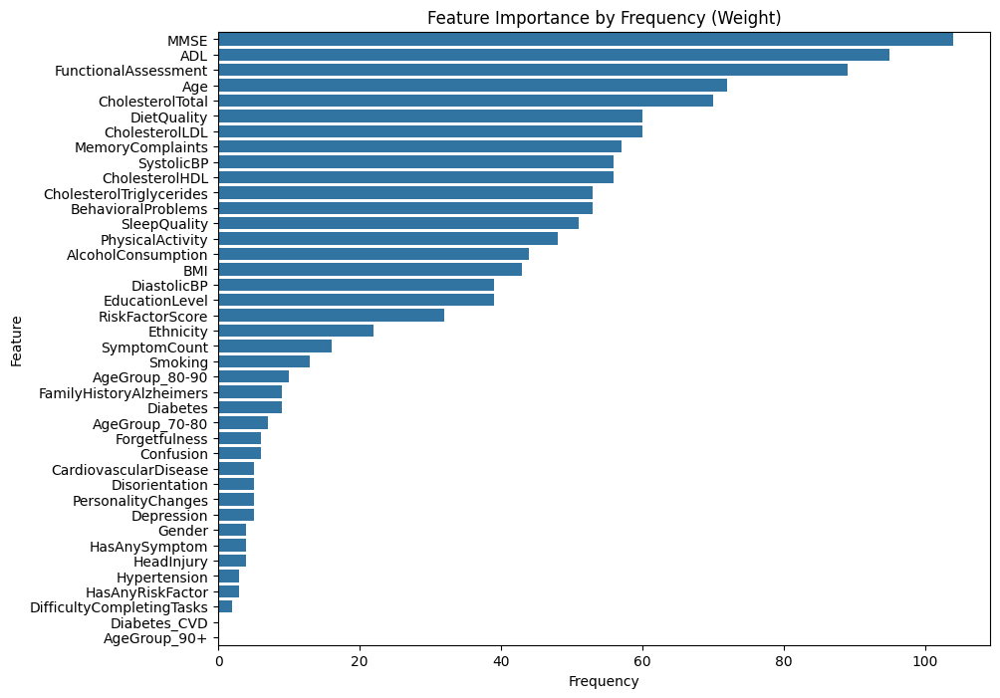

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Daftar semua fitur
all_features = dtrain.feature_names

# Mendapatkan booster object dari model XGBClassifier
booster = model.get_booster() # Get the booster object from the model

# Mendapatkan nilai Gain, Cover, dan Frequency untuk fitur yang digunakan
importance_gain = booster.get_score(importance_type='gain')  # Gain
importance_cover = booster.get_score(importance_type='cover')  # Cover
importance_frequency = booster.get_score(importance_type='weight')  # Frequency (Weight)

# Inisialisasi dictionary dengan semua fitur dan nilai default 0
importance_gain = {feature: importance_gain.get(feature, 0) for feature in all_features}
importance_cover = {feature: importance_cover.get(feature, 0) for feature in all_features}
importance_frequency = {feature: importance_frequency.get(feature, 0) for feature in all_features}

# Konversi ke DataFrame untuk plotting
df_importance = pd.DataFrame({
    'Feature': all_features,
    'Gain': [importance_gain[feature] for feature in all_features],
    'Cover': [importance_cover[feature] for feature in all_features],
    'Frequency': [importance_frequency[feature] for feature in all_features]
})

# Plot Gain
plt.figure(figsize=(10, 8))
sns.barplot(x='Gain', y='Feature', data=df_importance.sort_values(by='Gain', ascending=False))
plt.title("Feature Importance by Gain")
plt.show()

# Plot Cover
plt.figure(figsize=(10, 8))
sns.barplot(x='Cover', y='Feature', data=df_importance.sort_values(by='Cover', ascending=False))
plt.title("Feature Importance by Cover")
plt.show()

# Plot Frequency (Weight)
plt.figure(figsize=(10, 8))
sns.barplot(x='Frequency', y='Feature', data=df_importance.sort_values(by='Frequency', ascending=False))
plt.title("Feature Importance by Frequency (Weight)")
plt.show()

In [ ]:
import pandas as pd

# Gabungkan hasil ke dalam DataFrame
df_importance = pd.DataFrame({
    'Feature': list(importance_gain.keys()),
    'Gain': list(importance_gain.values()),
    'Cover': [importance_cover.get(k, 0) for k in importance_gain.keys()],
    'Frequency': [importance_frequency.get(k, 0) for k in importance_gain.keys()]
})

# Tampilkan tabel
print(df_importance)


                      Feature       Gain       Cover  Frequency
0                         Age   1.604962   35.822433       72.0
1                   Ethnicity   2.804985   37.506512       22.0
2              EducationLevel   2.654170   54.043587       39.0
3                         BMI   1.452448   24.646519       43.0
4          AlcoholConsumption   1.211177   23.078894       44.0
5            PhysicalActivity   1.400701   38.016197       48.0
6                 DietQuality   1.545524   24.543436       60.0
7                SleepQuality   2.700699   38.515530       51.0
8                  SystolicBP   1.194717   22.823566       56.0
9                 DiastolicBP   1.604553   29.745239       39.0
10           CholesterolTotal   1.600392   32.049026       70.0
11             CholesterolLDL   1.279532   33.668446       60.0
12             CholesterolHDL   1.413457   23.737917       56.0
13   CholesterolTriglycerides   1.522692   26.705803       53.0
14                       MMSE   9.561461

In [ ]:
pip install shap

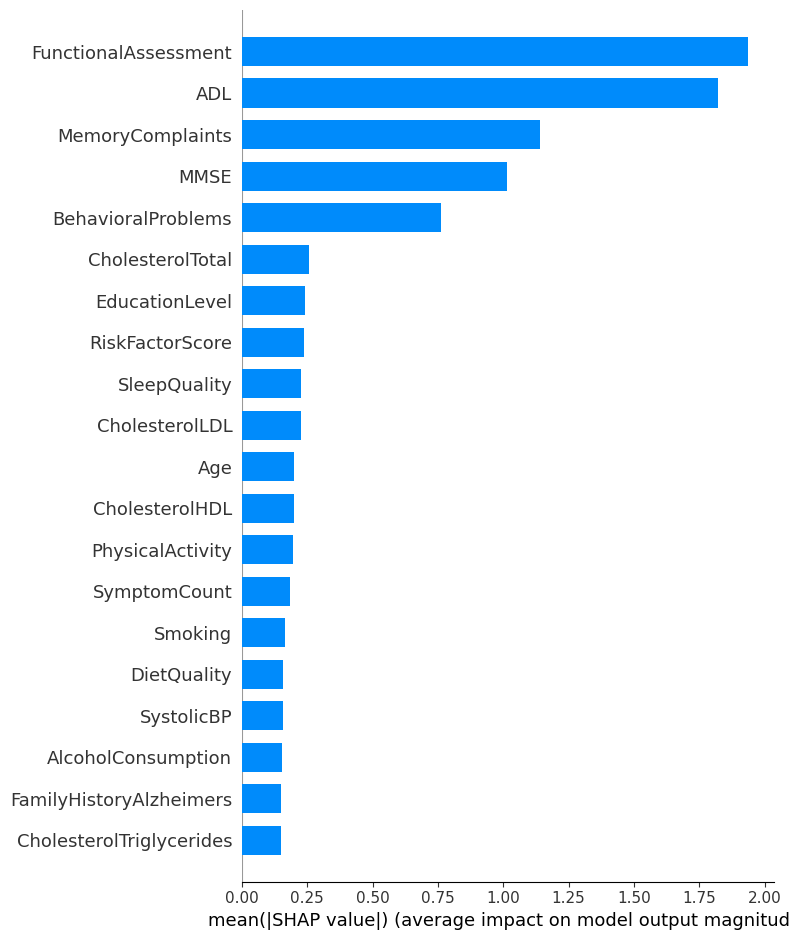

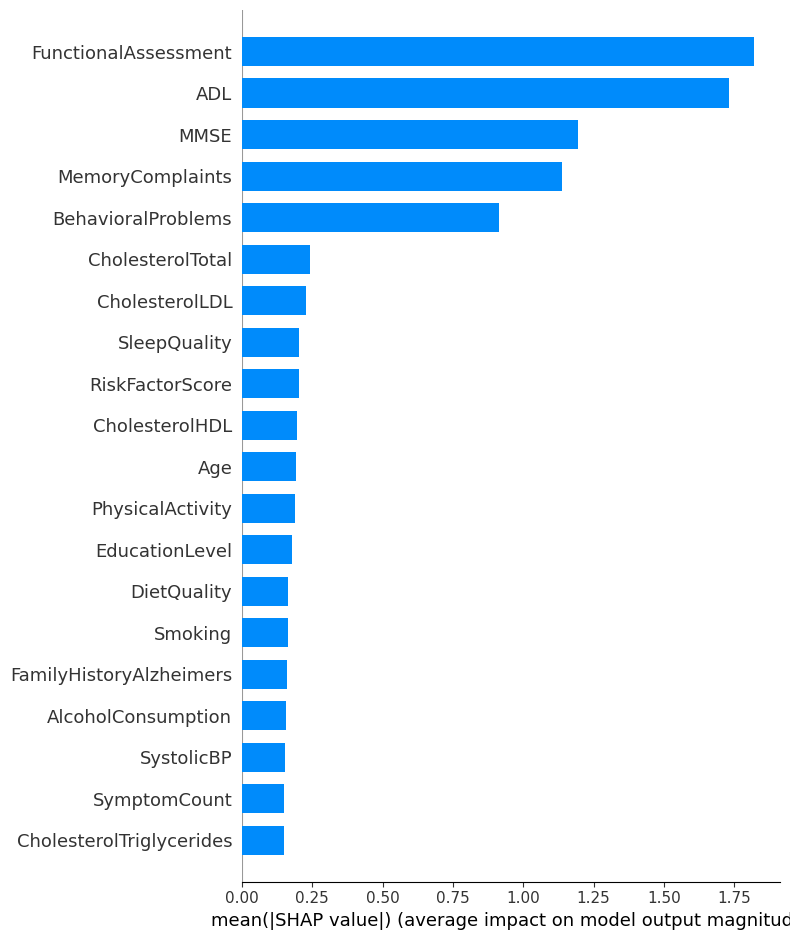

In [ ]:

import shap

# Menggunakan SHAP untuk mengevaluasi feature importance
explainer = shap.TreeExplainer(bst)
shap_values_train = explainer.shap_values(X_train_smote)
shap_values_test = explainer.shap_values(X_test)

# Plot SHAP summary untuk data training
shap.summary_plot(shap_values_train, X_train_smote, plot_type="bar")

# Plot SHAP summary untuk data testing
shap.summary_plot(shap_values_test, X_test, plot_type="bar")

# Detail SHAP values
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values_test, X_test)


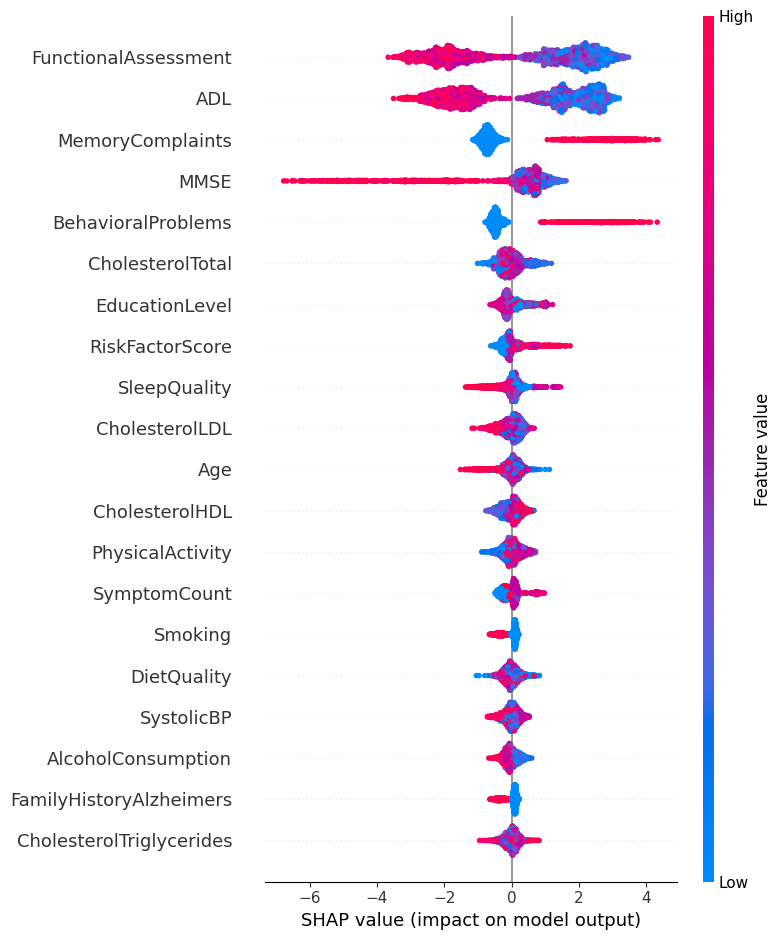

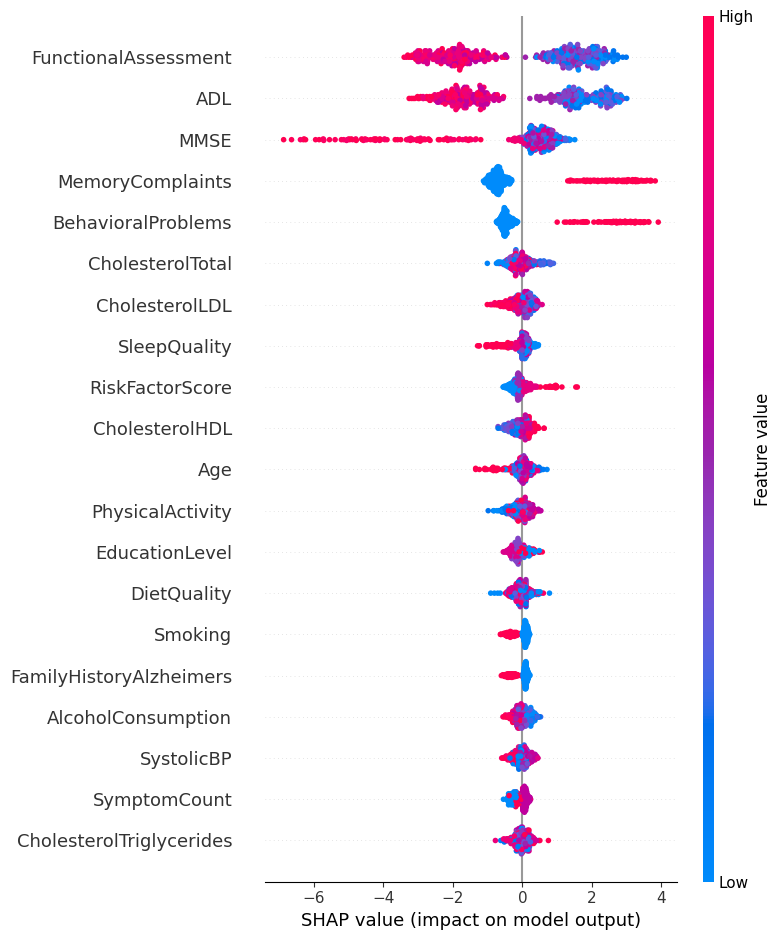

In [ ]:
# Menggunakan SHAP untuk mengevaluasi feature importance
explainer = shap.TreeExplainer(bst)
shap_values_train = explainer.shap_values(X_train_smote)
shap_values_test = explainer.shap_values(X_test)

# Plot SHAP summary untuk data training
shap.summary_plot(shap_values_train, X_train_smote)

# Plot SHAP summary untuk data testing
shap.summary_plot(shap_values_test, X_test)

# Detail SHAP values
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values_test, X_test)


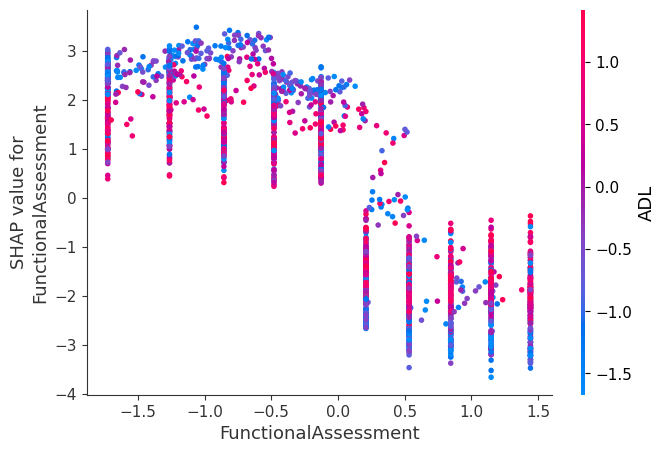

In [ ]:
# Dependence plot untuk satu variabel (misalnya 'feature_name')
shap.dependence_plot('FunctionalAssessment', shap_values_train, X_train_smote)


In [ ]:
import pandas as pd

# Konversi SHAP values menjadi DataFrame
shap_values_df = pd.DataFrame(shap_values_train, columns=X_train_smote.columns)

# Tampilkan beberapa baris pertama
print(shap_values_df.head(2149))

# Tampilkan SHAP values untuk 1000 observasi pertama
shap_values_2149 = shap_values_df.iloc[:2149, :]

# Tampilkan DataFrame SHAP values untuk 1000 observasi
print(shap_values_2149)


Streaming output truncated to the last 5000 lines.
1451                  -0.001261       0.059328           0.0   
1452                   0.013894      -0.133856           0.0   
1453                   0.003927       0.099500           0.0   
1454                   0.004691       0.029269           0.0   
1455                  -0.026012      -0.112746           0.0   
1456                   0.003927      -0.063829           0.0   
1457                  -0.014071       0.072647           0.0   
1458                  -0.086196       0.022751           0.0   
1459                   0.001234      -0.137768           0.0   
1460                  -0.008883       0.047741           0.0   
1461                  -0.001261      -0.098543           0.0   
1462                   0.003927       0.020261           0.0   
1463                  -0.009768      -0.120475           0.0   
1464                   0.001234      -0.042241           0.0   
1465                   0.003927      -0.048245       

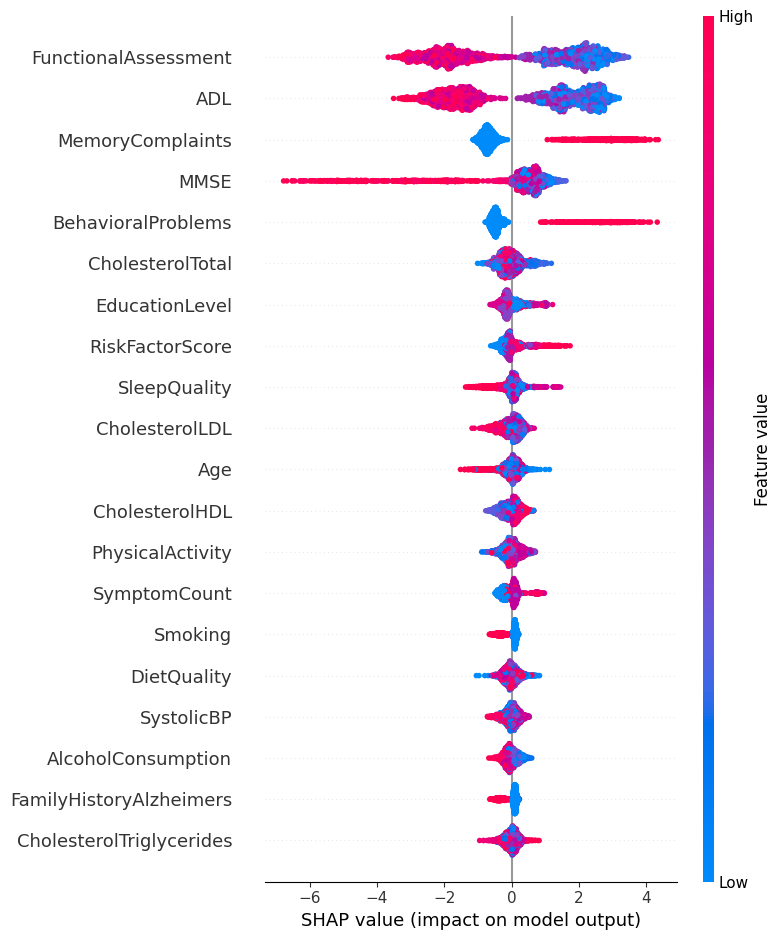

In [ ]:
# Plot SHAP summary untuk 1000 observasi pertama
shap.summary_plot(shap_values_train[:2149], X_train_smote.iloc[:2149, :])


In [ ]:
import shap
import pandas as pd
import xgboost as xgb

# Initialize the XGBoost model
model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', n_estimators=200)

# Fit the model to your training data
model.fit(X_train_smote, y_train_smote) # This line was missing

# Initialize the SHAP explainer with the fitted model
explainer = shap.TreeExplainer(model)

# Calculate SHAP values for the test data
shap_values = explainer.shap_values(X_test)

# Create a DataFrame to store mean absolute SHAP values
shap_importance = pd.DataFrame({
    'Feature': X_test.columns,
    'SHAP Importance': np.mean(np.abs(shap_values), axis=0)
})

# Sort features by importance
shap_importance = shap_importance.sort_values(by='SHAP Importance', ascending=False)

# Display the results in a table
print(shap_importance)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [11:04:07] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


                      Feature  SHAP Importance
15       FunctionalAssessment         2.659237
16                        ADL         2.276510
14                       MMSE         1.569608
27           MemoryComplaints         1.501064
28         BehavioralProblems         1.236663
11             CholesterolLDL         0.321731
10           CholesterolTotal         0.297310
7                SleepQuality         0.292098
5            PhysicalActivity         0.271865
12             CholesterolHDL         0.260046
0                         Age         0.252953
17            RiskFactorScore         0.246441
13   CholesterolTriglycerides         0.227473
4          AlcoholConsumption         0.226001
8                  SystolicBP         0.197177
20                    Smoking         0.190561
1                   Ethnicity         0.178898
6                 DietQuality         0.177410
3                         BMI         0.174149
21    FamilyHistoryAlzheimers         0.173829
2            

[0]	validation_0-logloss:0.49988	validation_1-logloss:0.50518
[1]	validation_0-logloss:0.38682	validation_1-logloss:0.39814


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [11:49:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[2]	validation_0-logloss:0.31667	validation_1-logloss:0.33546
[3]	validation_0-logloss:0.26902	validation_1-logloss:0.29317
[4]	validation_0-logloss:0.23569	validation_1-logloss:0.26637
[5]	validation_0-logloss:0.20922	validation_1-logloss:0.24972
[6]	validation_0-logloss:0.18675	validation_1-logloss:0.23956
[7]	validation_0-logloss:0.16890	validation_1-logloss:0.23237
[8]	validation_0-logloss:0.15288	validation_1-logloss:0.22909
[9]	validation_0-logloss:0.14076	validation_1-logloss:0.22330
[10]	validation_0-logloss:0.12890	validation_1-logloss:0.22402
[11]	validation_0-logloss:0.12131	validation_1-logloss:0.22734
[12]	validation_0-logloss:0.11314	validation_1-logloss:0.22604
[13]	validation_0-logloss:0.10609	validation_1-logloss:0.22195
[14]	validation_0-logloss:0.10033	validation_1-logloss:0.22412
[15]	validation_0-logloss:0.09222	validation_1-logloss:0.22413
[16]	validation_0-logloss:0.08764	validation_1-logloss:0.22172
[17]	validation_0-logloss:0.08122	validation_1-logloss:0.22163


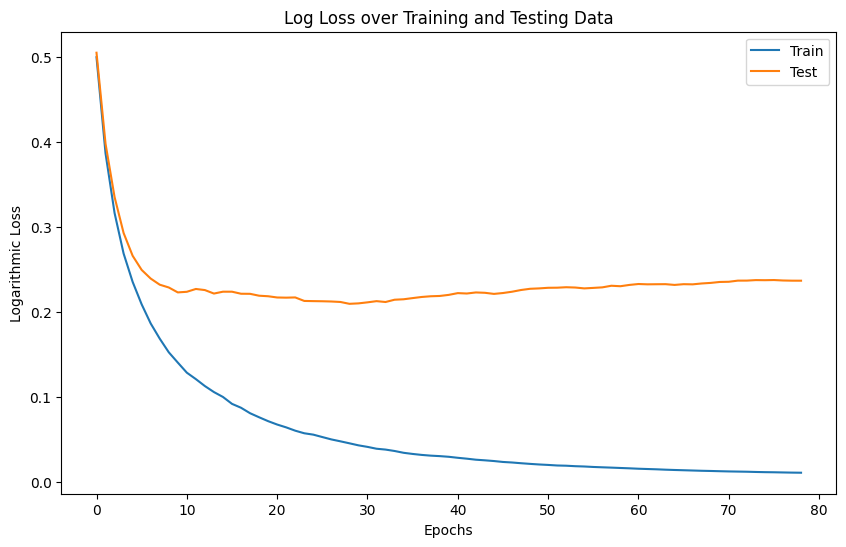

In [ ]:
import matplotlib.pyplot as plt
from xgboost import XGBClassifier

# Inisialisasi model XGBoost untuk klasifikasi
mod = XGBClassifier(use_label_encoder=False, eval_metric='logloss', n_estimators=200, early_stopping_rounds=50)

# Siapkan set evaluasi (training dan testing)
eval_set = [(X_train_smote, y_train_smote), (X_test, y_test)]

# Latih model sambil mencatat log loss
mod.fit(X_train_smote, y_train_smote, eval_set=eval_set, verbose= True)

# Mendapatkan hasil log loss dari pelatihan
results = mod.evals_result()

# Plot log loss untuk training dan testing
epochs = len(results['validation_0']['logloss'])
x_axis = range(0, epochs)

plt.figure(figsize=(10, 6))
plt.plot(x_axis, results['validation_0']['logloss'], label='Train')
plt.plot(x_axis, results['validation_1']['logloss'], label='Test')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Logarithmic Loss')
plt.title('Log Loss over Training and Testing Data')
plt.show()


[0]	validation_0-logloss:0.49988	validation_1-logloss:0.50518
[1]	validation_0-logloss:0.38682	validation_1-logloss:0.39814
[2]	validation_0-logloss:0.31667	validation_1-logloss:0.33546


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [11:52:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[3]	validation_0-logloss:0.26902	validation_1-logloss:0.29317
[4]	validation_0-logloss:0.23569	validation_1-logloss:0.26637
[5]	validation_0-logloss:0.20922	validation_1-logloss:0.24972
[6]	validation_0-logloss:0.18675	validation_1-logloss:0.23956
[7]	validation_0-logloss:0.16890	validation_1-logloss:0.23237
[8]	validation_0-logloss:0.15288	validation_1-logloss:0.22909
[9]	validation_0-logloss:0.14076	validation_1-logloss:0.22330
[10]	validation_0-logloss:0.12890	validation_1-logloss:0.22402
[11]	validation_0-logloss:0.12131	validation_1-logloss:0.22734
[12]	validation_0-logloss:0.11314	validation_1-logloss:0.22604
[13]	validation_0-logloss:0.10609	validation_1-logloss:0.22195
[14]	validation_0-logloss:0.10033	validation_1-logloss:0.22412
[15]	validation_0-logloss:0.09222	validation_1-logloss:0.22413
[16]	validation_0-logloss:0.08764	validation_1-logloss:0.22172
[17]	validation_0-logloss:0.08122	validation_1-logloss:0.22163
[18]	validation_0-logloss:0.07645	validation_1-logloss:0.21941

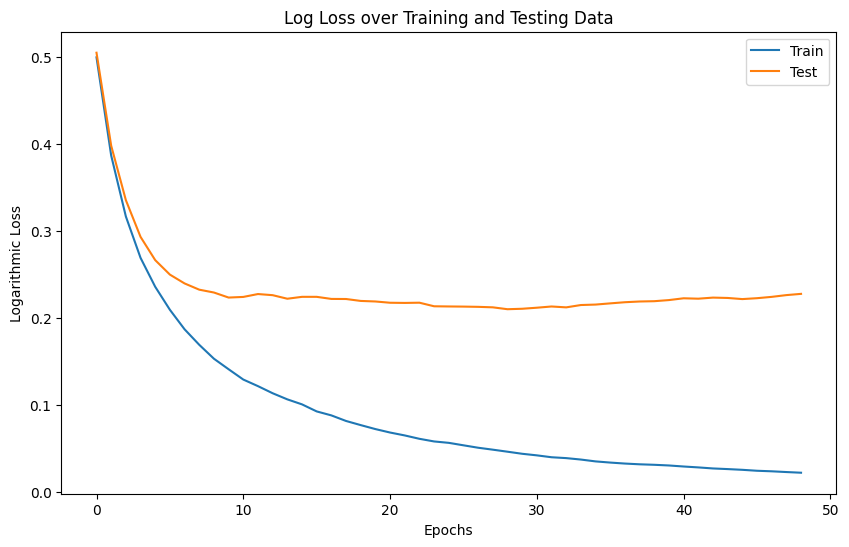

In [ ]:
import matplotlib.pyplot as plt
from xgboost import XGBClassifier

# Inisialisasi model XGBoost untuk klasifikasi
mod = XGBClassifier(use_label_encoder=False, eval_metric='logloss', n_estimators=200, early_stopping_rounds=20)

# Siapkan set evaluasi (training dan testing)
eval_set = [(X_train_smote, y_train_smote), (X_test, y_test)]

# Latih model sambil mencatat log loss
mod.fit(X_train_smote, y_train_smote, eval_set=eval_set, verbose= True)

# Mendapatkan hasil log loss dari pelatihan
results = mod.evals_result()

# Plot log loss untuk training dan testing
epochs = len(results['validation_0']['logloss'])
x_axis = range(0, epochs)

plt.figure(figsize=(10, 6))
plt.plot(x_axis, results['validation_0']['logloss'], label='Train')
plt.plot(x_axis, results['validation_1']['logloss'], label='Test')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Logarithmic Loss')
plt.title('Log Loss over Training and Testing Data')
plt.show()


Accuracy:  0.9418604651162791
Precision:  0.953405017921147
Recall:  0.9568345323741008
F1-Score:  0.9551166965888689
Confusion Matrix: 
 [[266  12]
 [ 13 139]]
ROC AUC Score: 0.9465874668686103


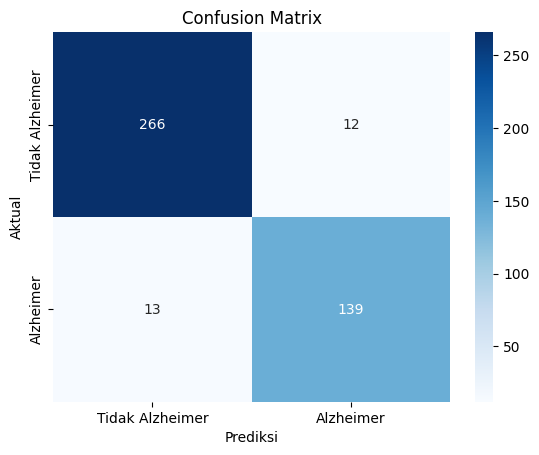

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve
import seaborn as sns
import matplotlib.pyplot as plt

# Prediksi dengan model sebelum hyperparameter tuning
preds = model.predict(X_test)  # Prediksi label (0 atau 1)
preds_proba = model.predict_proba(X_test)[:, 1]  # Probabilitas kelas positif (Alzheimer)

# =========== Accuracy, Precision, Recall, F1-Score ===========
accuracy = accuracy_score(y_test, preds)
precision = precision_score(y_test, preds, pos_label=0)
recall = recall_score(y_test, preds, pos_label=0)
f1 = f1_score(y_test, preds, pos_label=0)

print('Accuracy: ', accuracy)
print('Precision: ', precision)
print('Recall: ', recall)
print('F1-Score: ', f1)

# =========== Confusion Matrix ===========
cm = confusion_matrix(y_test, preds)

# Visualisasi confusion matrix
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)

# Memberikan label pada sumbu x dan y
ax.set_ylabel('Aktual')
ax.set_xlabel('Prediksi')
ax.set_title('Confusion Matrix')

# Memberikan label pada sumbu tick (kelas 0 dan 1)
ax.xaxis.set_ticklabels(['Tidak Alzheimer', 'Alzheimer'])
ax.yaxis.set_ticklabels(['Tidak Alzheimer', 'Alzheimer'])

# Cetak confusion matrix di konsol
print('Confusion Matrix: \n', cm)

# =========== ROC AUC ===========
roc_auc = roc_auc_score(y_test, preds_proba)
fpr, tpr, thresholds = roc_curve(y_test, preds_proba)

# Cetak nilai ROC AUC di konsol
print('ROC AUC Score:', roc_auc)



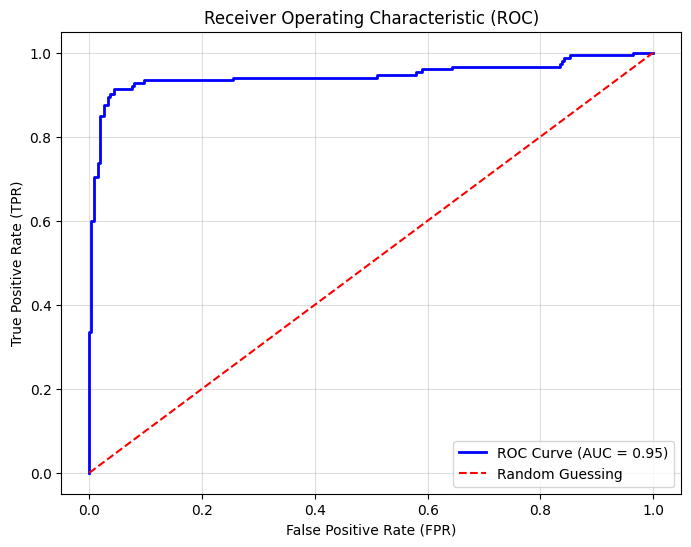

In [ ]:
# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random Guessing')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.grid(alpha=0.4)
plt.show()

{'alpha': 0, 'colsample_bylevel': 0.8, 'colsample_bytree': 0.8, 'gamma': 0, 'lambda': 1, 'learning_rate': 0.3, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 1.0}
XGBClassifier(alpha=0, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=0.8, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=1, learning_rate=0.3,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None, ...)
Training Score: 1.0
Testing Score: 0.9418604651162791
Accuracy:  0.9395348837209302
Precision:  0.959854

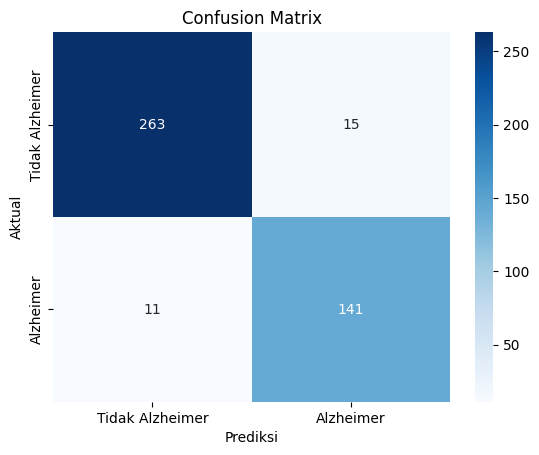

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve
import seaborn as sns
import matplotlib.pyplot as plt

# Cetak parameter terbaik dan model terbaik
print(best_params)
print(best_model)

# Evaluasi model pada data pelatihan dan pengujian
print("Training Score:", model.score(X_train_smote, y_train_smote))
print("Testing Score:", model.score(X_test, y_test))

# =========== Accuracy, Precision, Recall, F1-Score ===========
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, pos_label=0)  # Menggunakan kelas 0 sebagai kelas positif
recall = recall_score(y_test, y_pred, pos_label=0)
f1 = f1_score(y_test, y_pred, pos_label=0)

print('Accuracy: ', accuracy)
print('Precision: ', precision)
print('Recall: ', recall)
print('F1-Score: ', f1)

# =========== Confusion Matrix ===========
cm = confusion_matrix(y_test, y_pred)

# Visualisasi confusion matrix
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)

# Memberikan label pada sumbu x dan y
ax.set_ylabel('Aktual')
ax.set_xlabel('Prediksi')
ax.set_title('Confusion Matrix')

# Memberikan label pada sumbu tick (kelas 0 dan 1)
ax.xaxis.set_ticklabels(['Tidak Alzheimer', 'Alzheimer'])
ax.yaxis.set_ticklabels(['Tidak Alzheimer', 'Alzheimer'])

# Cetak confusion matrix di konsol
print('Confusion Matrix: \n', cm)

# =========== ROC AUC ===========
# Probabilitas prediksi kelas positif
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Menghitung ROC AUC Score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print('ROC AUC Score:', roc_auc)


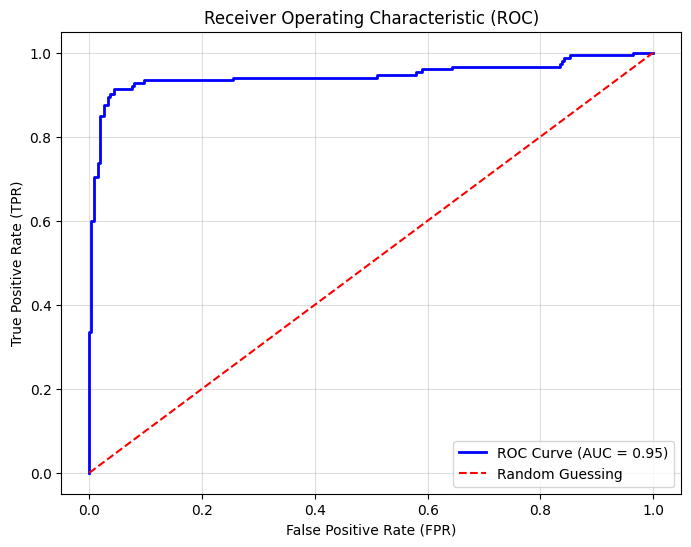

In [ ]:
# Plot ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random Guessing')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.grid(alpha=0.4)
plt.show()

ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

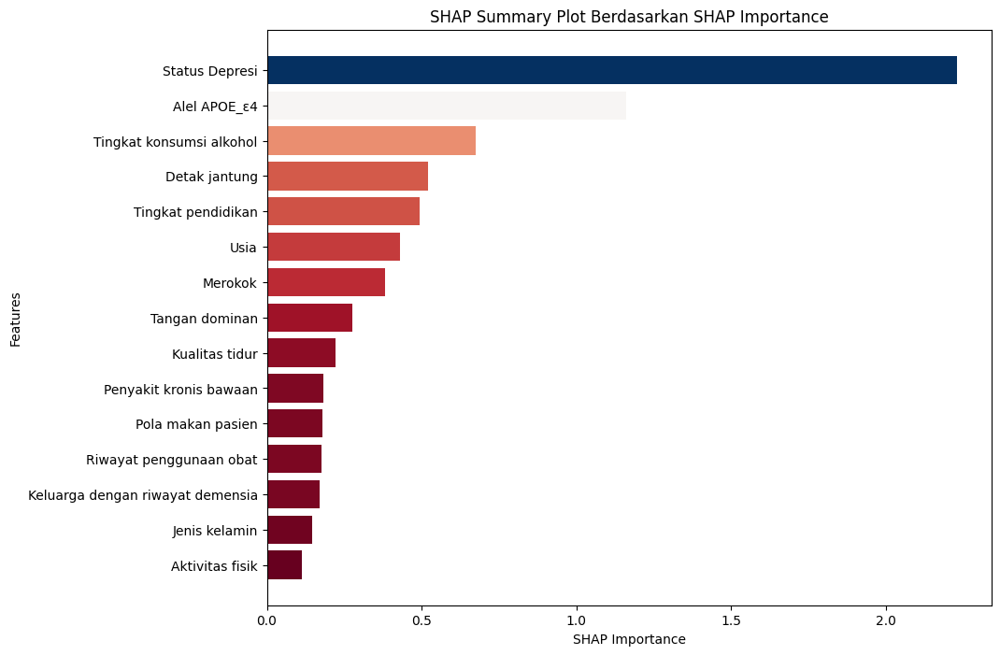

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Nama-nama variabel
features = [
    'Status Depresi', 'Alel APOE_ε4', 'Tingkat konsumsi alkohol',
    'Detak jantung', 'Tingkat pendidikan', 'Usia', 'Merokok',
    'Tangan dominan', 'Kualitas tidur', 'Penyakit kronis bawaan',
    'Pola makan pasien', 'Riwayat penggunaan obat', 'Keluarga dengan riwayat demensia',
    'Jenis kelamin', 'Aktivitas fisik'
]

# Nilai SHAP importance yang diberikan
shap_values = np.array([
    2.229530, 1.161550, 0.676475, 0.520929, 0.494704,
    0.431419, 0.382762, 0.275393, 0.222837, 0.181381,
    0.178337, 0.176047, 0.169393, 0.145683, 0.114203
])

# Normalisasi nilai SHAP untuk memberikan warna berdasarkan besar kecilnya nilai
norm_shap_values = (shap_values - min(shap_values)) / (max(shap_values) - min(shap_values))

# Membuat summary plot
plt.figure(figsize=(10, 8))
colors = plt.cm.RdBu(norm_shap_values)  # Menggunakan cmap untuk pewarnaan (Red ke Blue)

# Plot batang horizontal
plt.barh(features, shap_values, color=colors)
plt.xlabel('SHAP Importance')
plt.ylabel('Features')
plt.title('SHAP Summary Plot Berdasarkan SHAP Importance')
plt.gca().invert_yaxis()  # Membalik sumbu y agar fitur terpenting di atas
plt.colorbar(plt.cm.ScalarMappable(cmap='RdBu'), label='Nilai SHAP Normalized')
plt.show()


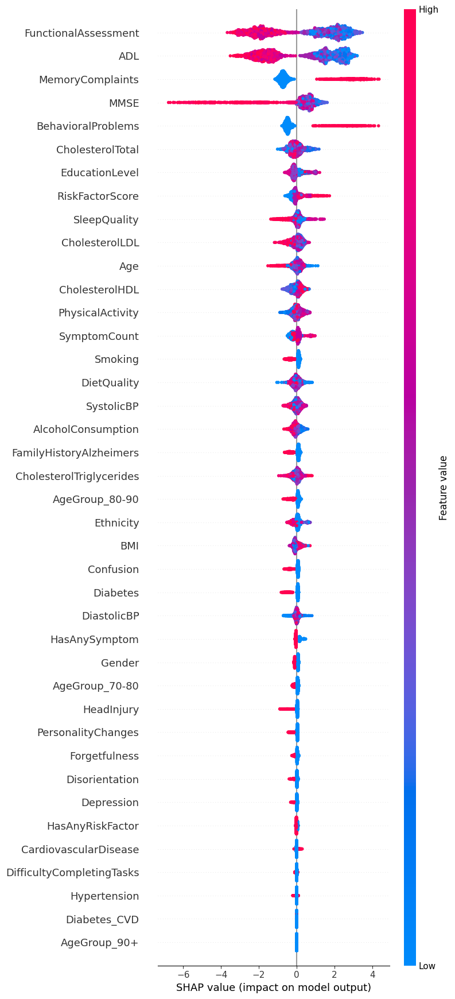

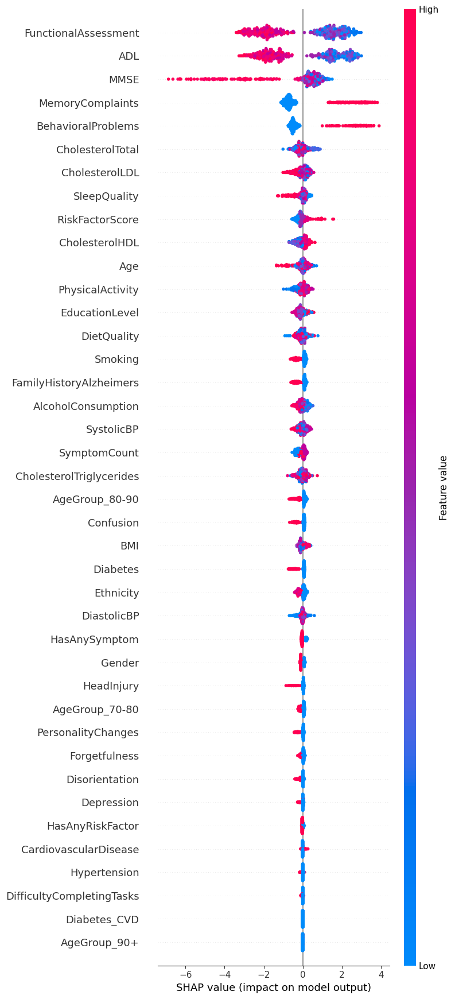

In [ ]:
import shap
import matplotlib.pyplot as plt

# ... (kode Anda sebelumnya untuk melatih model dan menghitung shap_values) ...

# Menggunakan SHAP untuk mengevaluasi feature importance
explainer = shap.TreeExplainer(bst)
shap_values_train = explainer.shap_values(X_train_smote)
shap_values_test = explainer.shap_values(X_test)

# Mendapatkan jumlah fitur
num_features = X_train_smote.shape[1]

# Plot SHAP summary untuk data training dengan semua fitur yang ditampilkan
plt.figure(figsize=(12, 8)) # Optional: Sesuaikan ukuran plot jika perlu
shap.summary_plot(shap_values_train, X_train_smote,
                  max_display=num_features, plot_type="dot") # plot_type="dot" untuk dataset besar

# Plot SHAP summary untuk data testing dengan semua fitur yang ditampilkan
plt.figure(figsize=(12, 8)) # Optional: Sesuaikan ukuran plot jika perlu
shap.summary_plot(shap_values_test, X_test,
                  max_display=num_features, plot_type="dot") # plot_type="dot" untuk dataset besar

# Detail SHAP values
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values_test, X_test)